# Read in Data

In [2]:
# ================================================================================
# Splitting training and test sets
# ================================================================================

import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

data=pd.read_csv('WAGE2_2025_abridged.csv')

state= (540491669 + 540712391 + 540575497 + 540750669 + 540744934)   # replace this number with the sum of the student IDs for the members of your group

train = data.sample(frac=0.8, random_state=state)
test = data[data.index.isin(train.index)==False].copy() # Only for prediction

train=train.reset_index(drop=True)
test=test.reset_index(drop=True)

In [3]:
train.head()

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage
0,1160,40,92,32,12,8,8,31,1,0,0,0,4,1.0,12.0,11.0,7.056175
1,722,55,113,36,16,8,1,38,0,0,1,1,1,2.0,8.0,NaN,6.582025
2,1160,40,84,35,12,17,2,38,1,0,0,0,4,2.0,16.0,12.0,7.056175
3,1000,50,104,36,16,11,8,30,1,0,0,1,1,1.0,12.0,11.0,6.907755
4,978,48,104,36,12,19,15,36,1,0,0,1,5,6.0,6.0,NaN,6.885510


In [4]:
train.isnull().sum()

wage         0
hours        0
IQ           0
KWW          0
educ         0
exper        0
tenure       0
age          0
married      0
black        0
south        0
urban        0
sibs         0
brthord     62
meduc       56
feduc      152
lwage        0
dtype: int64

# **Task 1**

### Numerical Summaries ###

In [7]:
numerical = train[['wage', 'hours', 'IQ', 'KWW', 'educ', 'exper', 'tenure', 'age', 'sibs', 'meduc', 'feduc', 'lwage']]
numerical.describe().round(3)

,wage,hours,IQ,KWW,educ,exper,tenure,age,sibs,meduc,feduc,lwage
count,733.000,733.000,733.000,733.000,733.000,733.000,733.000,733.000,733.000,677.000,581.000,733.000
mean,962.921,44.082,101.854,35.801,13.501,11.487,7.235,33.034,2.898,10.703,10.176,6.787
std,402.656,7.134,14.500,7.656,2.182,4.456,5.089,3.122,2.199,2.843,3.317,0.412
min,200.000,20.000,54.000,12.000,9.000,1.000,0.000,28.000,0.000,0.000,0.000,5.298
25%,675.000,40.000,93.000,31.000,12.000,8.000,3.000,30.000,1.000,8.000,8.000,6.515
50%,910.000,40.000,103.000,37.000,12.000,11.000,7.000,33.000,2.000,12.000,10.000,6.813
75%,1186.000,48.000,112.000,41.000,16.000,15.000,11.000,36.000,4.000,12.000,12.000,7.078
max,3078.000,80.000,145.000,56.000,18.000,23.000,22.000,38.000,14.000,18.000,18.000,8.032


### Categorical summaries ###

In [9]:
tab=pd.crosstab(data['married'], columns="count");tab

col_0,count
married,
0,98
1,818


In [10]:
tab=pd.crosstab(data['black'], columns="count");tab

col_0,count
black,
0,807
1,109


In [11]:
tab=pd.crosstab(data['south'], columns="count");tab

col_0,count
south,
0,608
1,308


In [12]:
tab=pd.crosstab(data['urban'], columns="count");tab

col_0,count
urban,
0,256
1,660


In [13]:
tab=pd.crosstab(data['brthord'], columns="count");tab

col_0,count
brthord,
1.0,339
2.0,237
3.0,125
4.0,56
5.0,33
6.0,28
7.0,8
8.0,5
9.0,2


### Visuals ###

<Axes: xlabel='wage'>

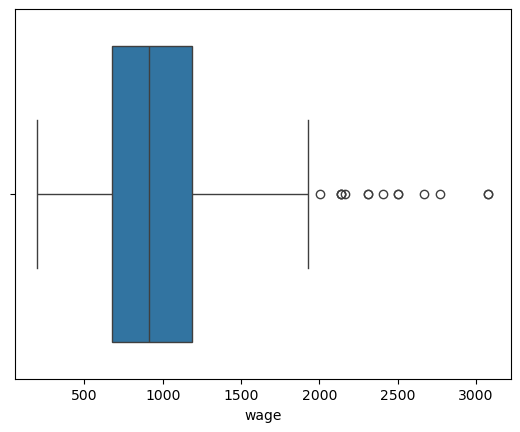

In [15]:
sns.boxplot(x=train['wage'])

<Axes: xlabel='married', ylabel='wage'>

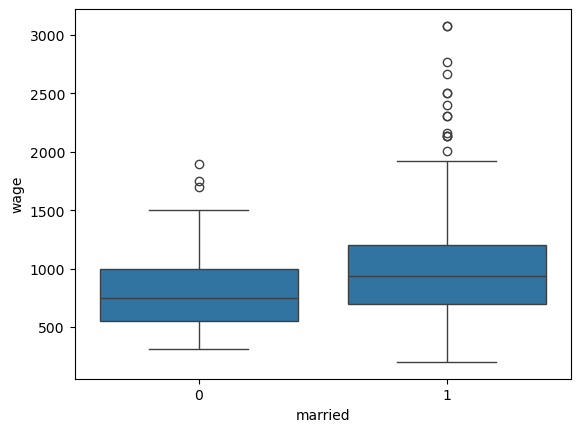

In [16]:
sns.boxplot(x='married', y='wage', data=train)

<Axes: xlabel='black', ylabel='wage'>

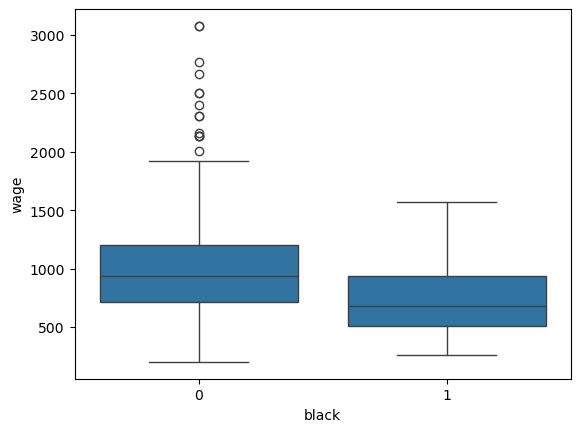

In [17]:
sns.boxplot(x='black', y='wage', data=train)

In [18]:
print(data.groupby('south')['wage'].mean())

south
0    1006.052632
1     868.993506
Name: wage, dtype: float64


In [19]:
print(data.groupby('urban')['wage'].mean())

urban
0     832.332031
1    1009.474242
Name: wage, dtype: float64


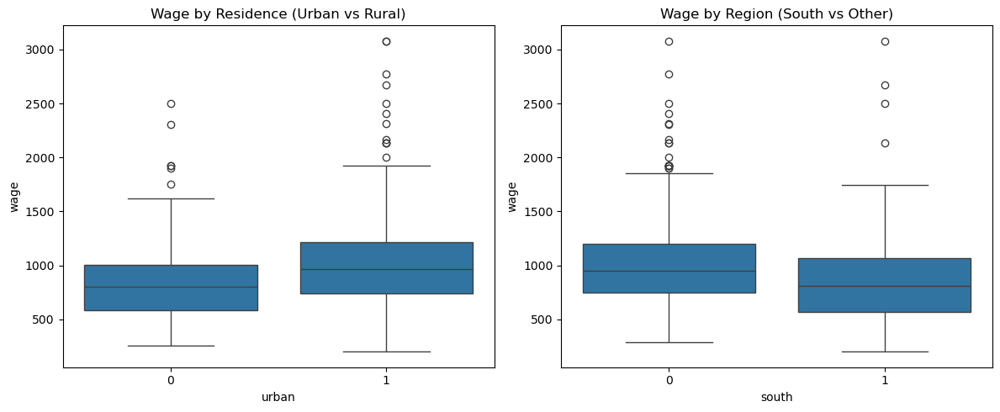

In [20]:
fig, axes = plt.subplots(1, 2, figsize=(12, 5))  # 1 row, 2 columns

# Boxplot 1: Urban vs Rural
sns.boxplot(x='urban', y='wage', data=train, ax=axes[0])
axes[0].set_title("Wage by Residence (Urban vs Rural)")

# Boxplot 2: South vs Other
sns.boxplot(x='south', y='wage', data=train, ax=axes[1])
axes[1].set_title("Wage by Region (South vs Other)")

plt.tight_layout()
plt.savefig('region wage.png')
plt.show()

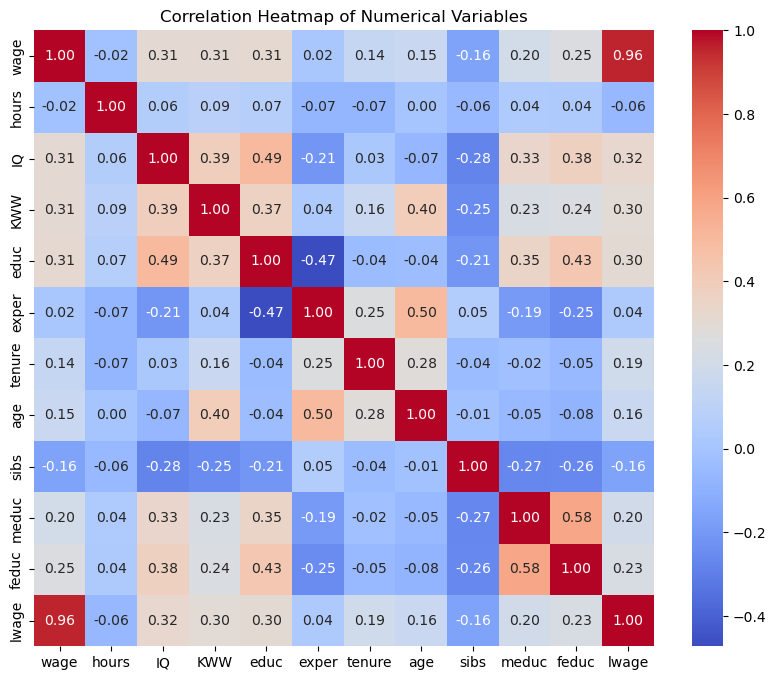

In [21]:
corr_matrix = numerical.corr()

plt.figure(figsize=(10, 8))  # Optional: adjust size
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlation Heatmap of Numerical Variables")
plt.savefig('heatmap all var.png')
plt.show()

### Comparing education in sub groups ###

In [23]:
print(data.groupby('south')['educ'].mean())

south
0    13.648026
1    13.185065
Name: educ, dtype: float64


In [24]:
print(data.groupby('urban')['educ'].mean())

urban
0    13.238281
1    13.590909
Name: educ, dtype: float64


In [25]:
print(data.groupby('black')['educ'].mean())

black
0    13.629492
1    12.477064
Name: educ, dtype: float64


In [26]:
print(data.groupby('married')['educ'].mean())

married
0    13.846939
1    13.449878
Name: educ, dtype: float64


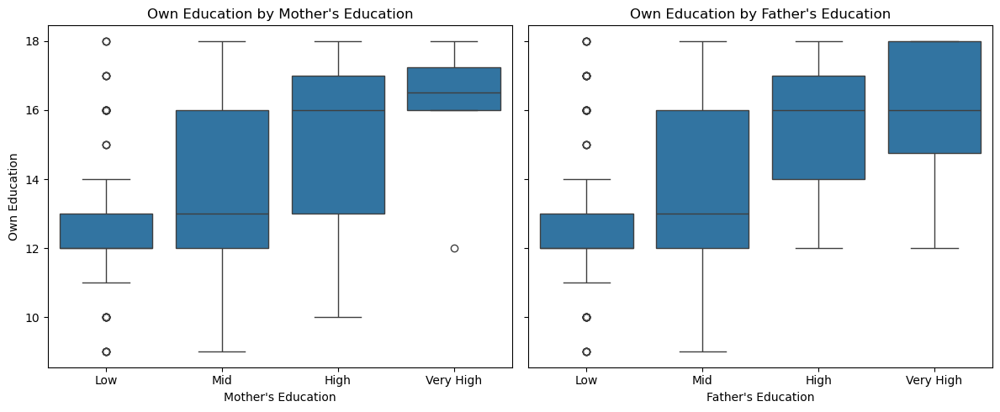

In [27]:
# Create bins for mother and father education
train['meduc_bin'] = pd.cut(train['meduc'], bins=[0, 8, 12, 16, 20], labels=['Low', 'Mid', 'High', 'Very High'])
train['feduc_bin'] = pd.cut(train['feduc'], bins=[0, 8, 12, 16, 20], labels=['Low', 'Mid', 'High', 'Very High'])

# Set up side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(12, 5), sharey=True)

# Mother's education
sns.boxplot(x='meduc_bin', y='educ', data=train, ax=axes[0])
axes[0].set_title("Own Education by Mother's Education")
axes[0].set_xlabel("Mother's Education")
axes[0].set_ylabel("Own Education")

# Father's education
sns.boxplot(x='feduc_bin', y='educ', data=train, ax=axes[1])
axes[1].set_title("Own Education by Father's Education")
axes[1].set_xlabel("Father's Education")
axes[1].set_ylabel("")

plt.tight_layout()
plt.savefig('parental education vs own education.png')
plt.show()

# **Task 2**

### MLR of education and experience on wage

In [30]:
t2_model = smf.ols('wage ~ educ + exper', data=train)
t2_reg = t2_model.fit()
t2_reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.133
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     55.84
Date:                Fri, 30 May 2025   Prob (F-statistic):           2.72e-23
Time:                        15:43:26   Log-Likelihood:                -5384.0
No. Observations:                 733   AIC:                         1.077e+04
Df Residuals:                     730   BIC:                         1.079e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -288.7780    122.739     -2.353      0.019    -529.742     -47.814
educ          76.1294      7.216     10.550      0.000      61.963      90.296
exper         19.4915      3.534      5.516      0.000      12.554      26.429
==============================================================================
Omnibus:                      191.273   Durbin-Watson:                   1.975
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              647.797
Skew:                           1.221   Prob(JB):                    2.15e-141
Kurtosis:                       6.905   Cond. No.                         159.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [31]:
#Extracting Fitted Values and Residuals from the Regression Model
t2_fit = t2_reg.fittedvalues
t2_resid = t2_reg.resid

In [32]:
t2_reg.mse_resid**0.5

375.5059302119657

In [33]:
t2_reg_rob = t2_model.fit(cov_type = 'HC0')
t2_reg_rob.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.133
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     47.42
Date:                Fri, 30 May 2025   Prob (F-statistic):           4.36e-20
Time:                        15:43:26   Log-Likelihood:                -5384.0
No. Observations:                 733   AIC:                         1.077e+04
Df Residuals:                     730   BIC:                         1.079e+04
Df Model:                           2                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -288.7780    128.375     -2.249      0.024    -540.388     -37.168
educ          76.1294      7.848      9.700      0.000      60.747      91.512
exper         19.4915      3.479      5.603      0.000      12.673      26.310
==============================================================================
Omnibus:                      191.273   Durbin-Watson:                   1.975
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              647.797
Skew:                           1.221   Prob(JB):                    2.15e-141
Kurtosis:                       6.905   Cond. No.                         159.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

After correcting for potential heteroskedasticity using HC1 robust standard errors, the model’s coefficients remained statistically significant, suggesting that the key relationships are robust. However, the increase in standard errors and the lower F-statistic indicate that inference under standard OLS may have understated uncertainty.

In [35]:
t2_slr_educ_model = smf.ols('wage ~ educ', data=train).fit()
t2_slr_educ_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.097
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     78.11
Date:                Fri, 30 May 2025   Prob (F-statistic):           7.21e-18
Time:                        15:43:26   Log-Likelihood:                -5399.0
No. Observations:                 733   AIC:                         1.080e+04
Df Residuals:                     731   BIC:                         1.081e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    188.8699     88.719      2.129      0.034      14.695     363.045
educ          57.3342      6.487      8.838      0.000      44.598      70.070
==============================================================================
Omnibus:                      179.416   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              550.454
Skew:                           1.179   Prob(JB):                    2.95e-120
Kurtosis:                       6.531   Cond. No.                         86.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [36]:
t2_slr_exper_model = smf.ols('wage ~ exper', data=train).fit()
t2_slr_exper_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.3188
Date:                Fri, 30 May 2025   Prob (F-statistic):              0.572
Time:                        15:43:26   Log-Likelihood:                -5436.0
No. Observations:                 733   AIC:                         1.088e+04
Df Residuals:                     731   BIC:                         1.089e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    941.2470     41.168     22.863      0.000     860.425    1022.069
exper          1.8868      3.342      0.565      0.572      -4.673       8.447
==============================================================================
Omnibus:                      186.803   Durbin-Watson:                   1.952
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              509.904
Skew:                           1.275   Prob(JB):                    1.89e-111
Kurtosis:                       6.193   Cond. No.                         34.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

### LSA 1: Linearity

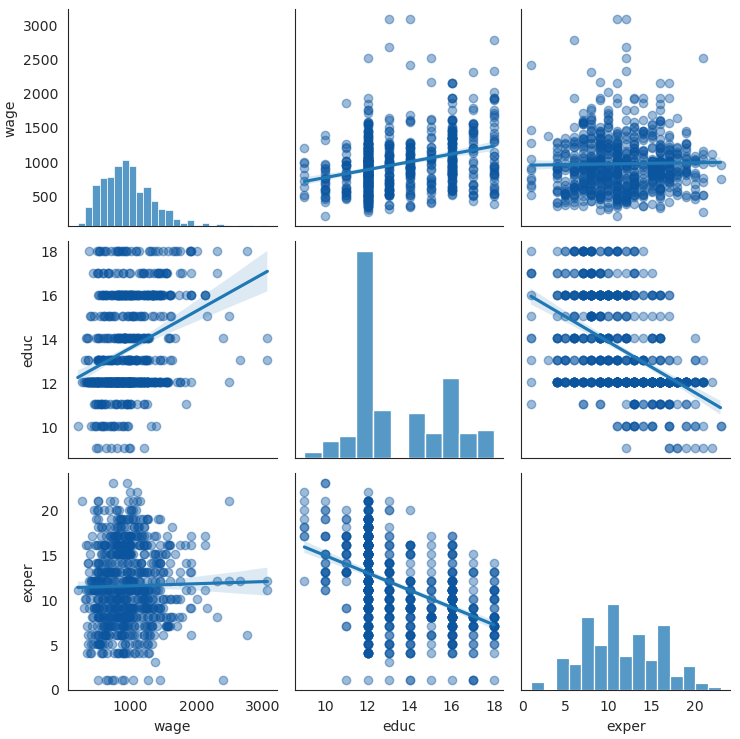

In [38]:

variables=['wage', 'educ', 'exper']
with sns.axes_style('white'):
    g=sns.pairplot(train[variables], kind='reg',
                   plot_kws={'scatter_kws' :{'color': sns.color_palette('Blues')[-1], 'alpha': 0.4}})
plt.tight_layout()

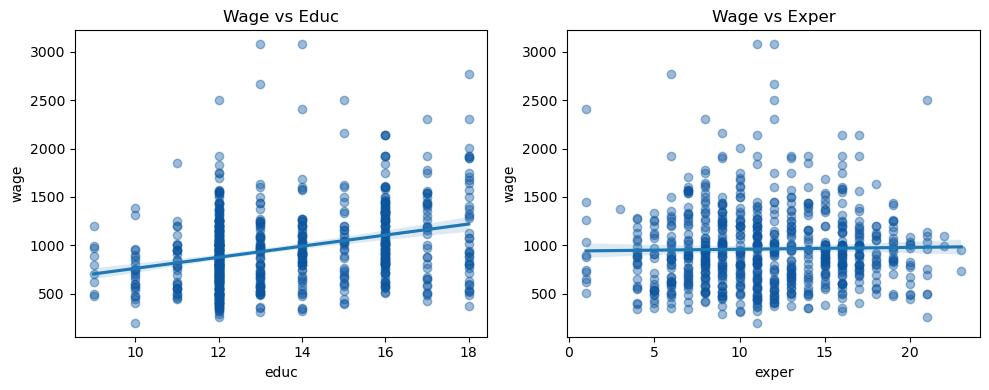

In [39]:
plt.figure(figsize=(10, 4))

# Top-middle: wage vs educ
plt.subplot(1, 2, 1)
sns.regplot(x='educ', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs Educ')

# Top-right: wage vs exper
plt.subplot(1, 2, 2)
sns.regplot(x='exper', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs Exper')

plt.tight_layout()
plt.show()

### LSA 2: Exogeneity

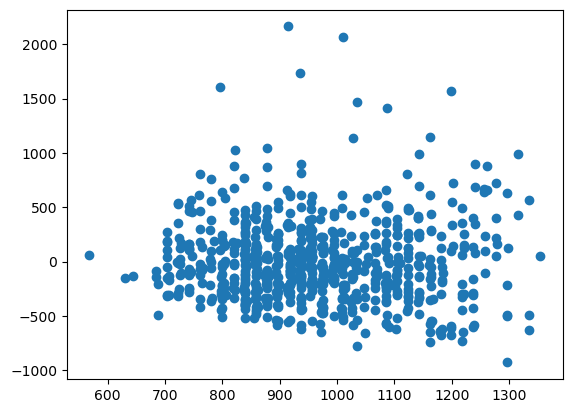

In [41]:
plt.scatter(t2_fit, t2_resid)
plt.show()

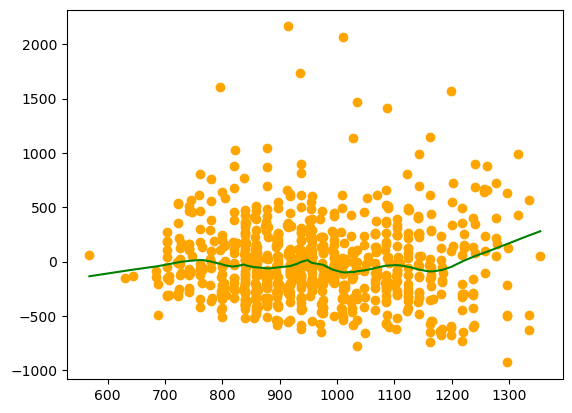

In [42]:
lowess = sm.nonparametric.lowess
plt.scatter(t2_fit, t2_resid, color='orange')
t2_z = lowess(t2_resid, t2_fit, frac=1./5)
plt.plot(t2_z[:,0],t2_z[:,1],'green')
plt.show()

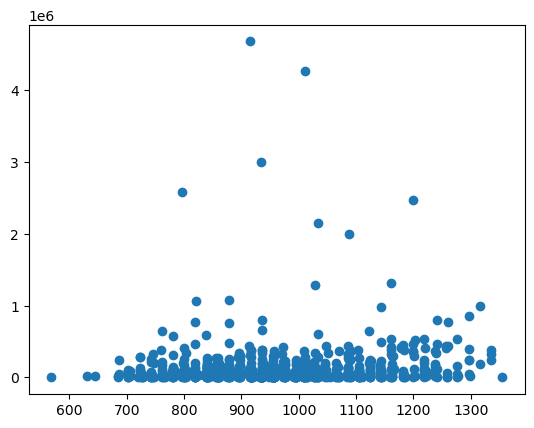

In [43]:
#Squared Residuals for MLR
t2_resid2=t2_reg.resid**2
plt.scatter(t2_fit, t2_resid2)
plt.show()

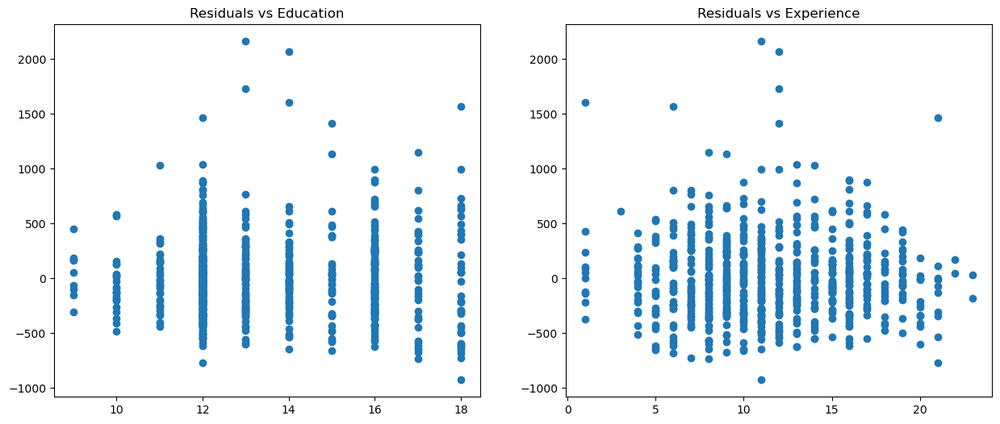

In [44]:
#Residuals against predictors
fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)

ax1.scatter(train['educ'], t2_resid)
ax1.set_title("Residuals vs Education")

ax2.scatter(train['exper'], t2_resid)
ax2.set_title("Residuals vs Experience")

plt.show()

### LSA 3: Data is IID

The data represent a cross-sectional survey of income earners, with each row corresponding to a distinct individual. Given that the observations are drawn independently from a population and reflect individual-level attributes, we assume the data satisfy LSA 3, the observations are independent and identically distributed.

### LSA 4: All 4th Moments Exist

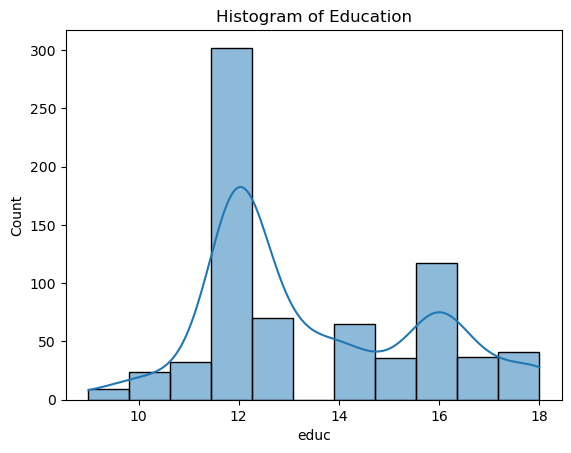

In [48]:
sns.histplot(train['educ'], kde=True)
plt.title("Histogram of Education")
plt.savefig('hist educ.png')
plt.show()

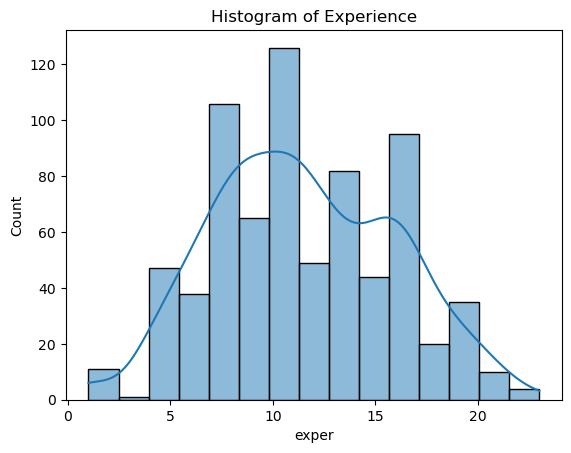

In [49]:
sns.histplot(train['exper'], kde=True)
plt.title("Histogram of Experience")
plt.savefig('hist exper.png')
plt.show()

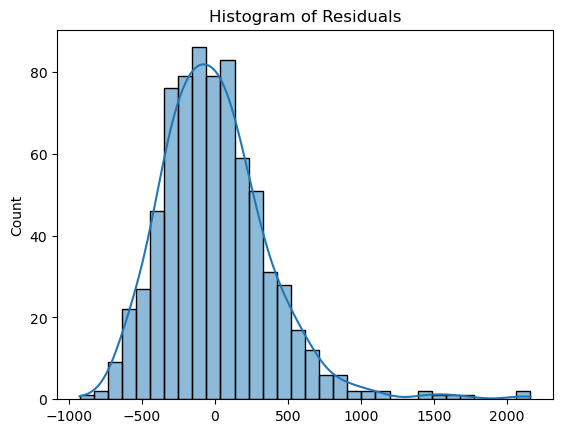

In [50]:
sns.histplot(t2_resid, kde=True)
plt.title("Histogram of Residuals")
plt.show()

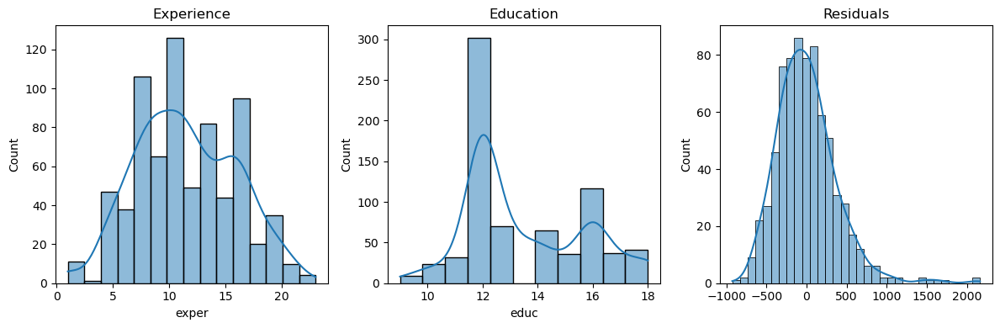

In [51]:
fig, axes = plt.subplots(1, 3, figsize=(12, 4))  # 1 row, 3 columns

sns.histplot(train['exper'], kde=True, ax=axes[0])
axes[0].set_title("Experience")

sns.histplot(train['educ'], kde=True, ax=axes[1])
axes[1].set_title("Education")

sns.histplot(t2_resid, kde=True, ax=axes[2])  
axes[2].set_title("Residuals")

plt.tight_layout()
plt.savefig("lsa4_histograms.png", dpi=300, bbox_inches='tight')

### LSA 5: No Perfect Collinearity

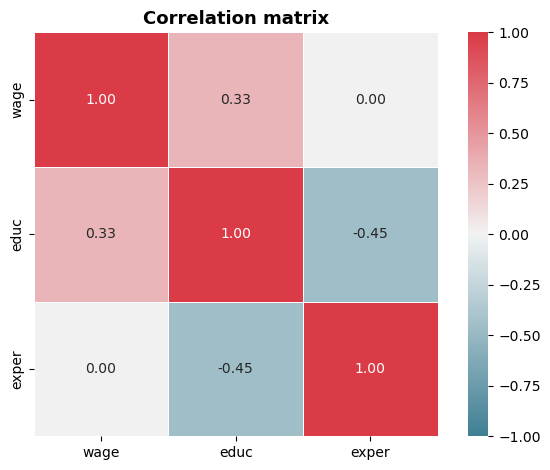

In [53]:
fig, ax = plt.subplots()
variables = ['wage', 'educ', 'exper']
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(data[variables].corr(), vmax=1, vmin=-1, center=0, square=True, linewidths=0.5, annot=True, fmt='.2f', ax=ax, cmap=cmap)

ax.set_title('Correlation matrix', fontweight='bold', fontsize=13)
plt.tight_layout()
plt.savefig('correlation matrix.png')
plt.show()

### LSA 6: Homoskedacity

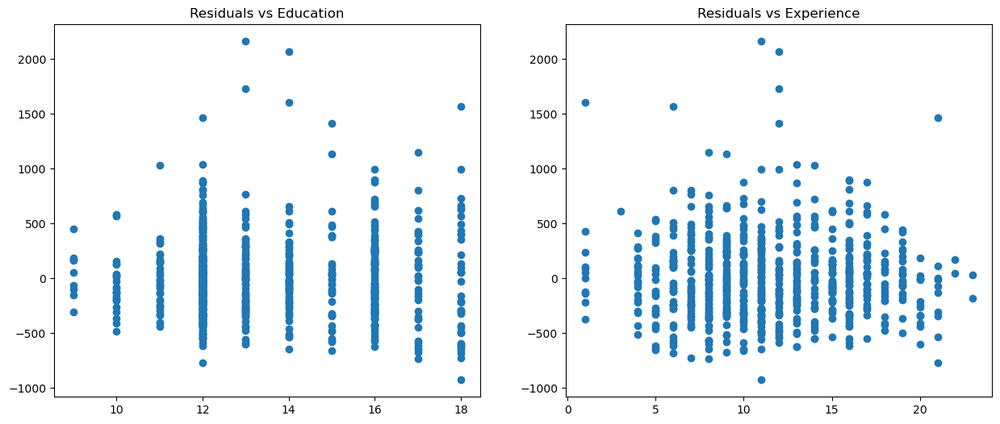

In [55]:
fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1.scatter(train['educ'], t2_resid)
ax1.set_title('Residuals vs Education')
ax2.scatter(train['exper'], t2_resid)
ax2.set_title('Residuals vs Experience')
plt.savefig('homoskedacity.png')
plt.show()

# **Task 3**

### Relationship between Wage and Education, and Wage and Experience ###

In [58]:
t3_slr_educ_model = smf.ols('wage ~ educ', data=train).fit()
t3_slr_educ_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.097
Model:                            OLS   Adj. R-squared:                  0.095
Method:                 Least Squares   F-statistic:                     78.11
Date:                Fri, 30 May 2025   Prob (F-statistic):           7.21e-18
Time:                        15:43:31   Log-Likelihood:                -5399.0
No. Observations:                 733   AIC:                         1.080e+04
Df Residuals:                     731   BIC:                         1.081e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    188.8699     88.719      2.129      0.034      14.695     363.045
educ          57.3342      6.487      8.838      0.000      44.598      70.070
==============================================================================
Omnibus:                      179.416   Durbin-Watson:                   1.996
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              550.454
Skew:                           1.179   Prob(JB):                    2.95e-120
Kurtosis:                       6.531   Cond. No.                         86.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [59]:
t2_slr_exper_model = smf.ols('wage ~ exper', data=train).fit()
t2_slr_exper_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.000
Model:                            OLS   Adj. R-squared:                 -0.001
Method:                 Least Squares   F-statistic:                    0.3188
Date:                Fri, 30 May 2025   Prob (F-statistic):              0.572
Time:                        15:43:31   Log-Likelihood:                -5436.0
No. Observations:                 733   AIC:                         1.088e+04
Df Residuals:                     731   BIC:                         1.089e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    941.2470     41.168     22.863      0.000     860.425    1022.069
exper          1.8868      3.342      0.565      0.572      -4.673       8.447
==============================================================================
Omnibus:                      186.803   Durbin-Watson:                   1.952
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              509.904
Skew:                           1.275   Prob(JB):                    1.89e-111
Kurtosis:                       6.193   Cond. No.                         34.3
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [60]:
def forward_selected(data, response, nominated = []):  
    """Linear model designed by forward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by forward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    selected = nominated
    remaining.remove(response)
    remaining ^= set(selected)
    current_score, best_new_score = 0.0, 0.0
    if nominated:
        formula = "{} ~ {} + 1".format(response, ' + '.join(nominated))
        current_score= smf.ols(formula, data).fit().rsquared_adj
        best_new_score = current_score
        print("you nominated variable(s) %s, the adj_r2 is: %f" %(nominated, current_score))
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("adding %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [61]:
df = train[['wage', 'educ', 'exper', 'hours', 'IQ', 'KWW', 'tenure', 'age', 'married', 'black', 'south', 'urban', 'sibs', 'meduc', 'feduc']]

In [62]:
model = forward_selected(df, 'wage')

adding educ increases adj_r2 from 0.000000 to 0.095299
adding KWW increases adj_r2 from 0.095299 to 0.138050
adding urban increases adj_r2 from 0.138050 to 0.161508
adding exper increases adj_r2 from 0.161508 to 0.181577
adding married increases adj_r2 from 0.181577 to 0.198835
adding IQ increases adj_r2 from 0.198835 to 0.215564
adding black increases adj_r2 from 0.215564 to 0.222994
adding tenure increases adj_r2 from 0.222994 to 0.228216
adding hours increases adj_r2 from 0.228216 to 0.230359
adding age increases adj_r2 from 0.230359 to 0.230768
adding south increases adj_r2 from 0.230768 to 0.230818
final model is wage ~ educ + KWW + urban + exper + married + IQ + black + tenure + hours + age + south + 1, with adj_r2 of 0.230818


In [63]:
t3_mlr_model1 = smf.ols(formula='wage ~ exper + educ + KWW', data=train)
t3_mlr1 = t3_mlr_model1.fit(cov_type='HC0')  # robust standard errors
t3_mlr1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.160
Model:                            OLS   Adj. R-squared:                  0.157
Method:                 Least Squares   F-statistic:                     38.19
Date:                Fri, 30 May 2025   Prob (F-statistic):           6.27e-23
Time:                        15:43:32   Log-Likelihood:                -5372.1
No. Observations:                 733   AIC:                         1.075e+04
Df Residuals:                     729   BIC:                         1.077e+04
Df Model:                           3                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -355.7322    126.764     -2.806      0.005    -604.185    -107.280
exper         14.9671      3.569      4.194      0.000       7.973      21.962
educ          59.1144      8.289      7.131      0.000      42.867      75.361
KWW            9.7383      2.190      4.448      0.000       5.447      14.030
==============================================================================
Omnibus:                      188.781   Durbin-Watson:                   1.952
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              660.728
Skew:                           1.192   Prob(JB):                    3.35e-144
Kurtosis:                       6.993   Cond. No.                         362.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [64]:
t3_mlr_model1 = smf.ols(formula='wage ~ exper + educ + KWW + urban', data=train)
t3_mlr1 = t3_mlr_model1.fit(cov_type='HC0')  # robust standard errors
t3_mlr1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.186
Model:                            OLS   Adj. R-squared:                  0.182
Method:                 Least Squares   F-statistic:                     37.49
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.56e-28
Time:                        15:43:32   Log-Likelihood:                -5360.7
No. Observations:                 733   AIC:                         1.073e+04
Df Residuals:                     728   BIC:                         1.075e+04
Df Model:                           4                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -436.6903    124.972     -3.494      0.000    -681.632    -191.749
exper         15.4144      3.526      4.372      0.000       8.504      22.325
educ          58.6441      8.190      7.161      0.000      42.593      74.696
KWW            9.2361      2.154      4.289      0.000       5.015      13.457
urban        141.9933     27.771      5.113      0.000      87.564     196.423
==============================================================================
Omnibus:                      192.412   Durbin-Watson:                   1.955
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              693.466
Skew:                           1.206   Prob(JB):                    2.60e-151
Kurtosis:                       7.110   Cond. No.                         366.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [65]:
t3_mlr_model2 = smf.ols(formula='wage ~ exper + educ + KWW + urban + married', data=train)
t3_mlr2 = t3_mlr_model2.fit(cov_type='HC0')  # robust standard errors
t3_mlr2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.204
Model:                            OLS   Adj. R-squared:                  0.199
Method:                 Least Squares   F-statistic:                     33.41
Date:                Fri, 30 May 2025   Prob (F-statistic):           9.54e-31
Time:                        15:43:32   Log-Likelihood:                -5352.4
No. Observations:                 733   AIC:                         1.072e+04
Df Residuals:                     727   BIC:                         1.074e+04
Df Model:                           5                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -581.3416    129.276     -4.497      0.000    -834.718    -327.966
exper         14.4233      3.516      4.103      0.000       7.533      21.314
educ          60.1865      7.984      7.539      0.000      44.538      75.835
KWW            8.5706      2.132      4.021      0.000       4.393      12.748
urban        146.4248     27.454      5.333      0.000      92.616     200.234
married      175.2809     39.931      4.390      0.000      97.017     253.545
==============================================================================
Omnibus:                      197.420   Durbin-Watson:                   1.945
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              720.732
Skew:                           1.234   Prob(JB):                    3.13e-157
Kurtosis:                       7.184   Cond. No.                         384.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [66]:
t3_mlr_model3 = smf.ols(formula='wage ~ exper + educ + KWW + urban + married + IQ', data=train)
t3_mlr3 = t3_mlr_model3.fit(cov_type='HC0')  # robust standard errors
t3_mlr3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.222
Model:                            OLS   Adj. R-squared:                  0.216
Method:                 Least Squares   F-statistic:                     32.64
Date:                Fri, 30 May 2025   Prob (F-statistic):           6.93e-35
Time:                        15:43:32   Log-Likelihood:                -5344.2
No. Observations:                 733   AIC:                         1.070e+04
Df Residuals:                     726   BIC:                         1.073e+04
Df Model:                           6                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -808.5168    133.890     -6.039      0.000   -1070.936    -546.098
exper         14.9968      3.490      4.297      0.000       8.156      21.838
educ          48.9179      8.377      5.840      0.000      32.500      65.336
KWW            6.4979      2.226      2.919      0.004       2.135      10.861
urban        147.7872     27.116      5.450      0.000      94.640     200.934
married      172.6879     39.033      4.424      0.000      96.184     249.191
IQ             4.4011      1.073      4.100      0.000       2.297       6.505
==============================================================================
Omnibus:                      198.529   Durbin-Watson:                   1.952
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              726.188
Skew:                           1.241   Prob(JB):                    2.04e-158
Kurtosis:                       7.198   Cond. No.                     1.14e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.14e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [67]:
t3_mlr_model4 = smf.ols(formula='wage ~ exper + educ + KWW + urban + married + IQ + black ', data=train)
t3_mlr4 = t3_mlr_model4.fit(cov_type='HC0')  # robust standard errors
t3_mlr4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.230
Model:                            OLS   Adj. R-squared:                  0.223
Method:                 Least Squares   F-statistic:                     31.28
Date:                Fri, 30 May 2025   Prob (F-statistic):           5.68e-38
Time:                        15:43:32   Log-Likelihood:                -5340.2
No. Observations:                 733   AIC:                         1.070e+04
Df Residuals:                     725   BIC:                         1.073e+04
Df Model:                           7                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -688.8312    141.907     -4.854      0.000    -966.964    -410.699
exper         14.9639      3.461      4.323      0.000       8.180      21.748
educ          49.2767      8.361      5.894      0.000      32.890      65.663
KWW            5.8038      2.240      2.591      0.010       1.414      10.194
urban        154.8932     27.187      5.697      0.000     101.608     208.178
married      170.8695     38.357      4.455      0.000      95.692     246.048
IQ             3.5312      1.091      3.236      0.001       1.392       5.670
black       -127.5345     37.357     -3.414      0.001    -200.753     -54.316
==============================================================================
Omnibus:                      199.585   Durbin-Watson:                   1.949
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              724.710
Skew:                           1.250   Prob(JB):                    4.28e-158
Kurtosis:                       7.180   Cond. No.                     1.20e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [68]:
t3_mlr_model = smf.ols(formula='wage ~ exper + educ + KWW + urban + married + IQ + black + tenure', data=train)
t3_mlr_final = t3_mlr_model.fit(cov_type='HC0')  # robust standard errors
t3_mlr_final.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                     29.21
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.26e-39
Time:                        15:43:32   Log-Likelihood:                -5337.2
No. Observations:                 733   AIC:                         1.069e+04
Df Residuals:                     724   BIC:                         1.073e+04
Df Model:                           8                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -683.0066    141.388     -4.831      0.000    -960.122    -405.891
exper         13.0178      3.588      3.628      0.000       5.985      20.051
educ          48.8057      8.333      5.857      0.000      32.474      65.138
KWW            5.2590      2.257      2.330      0.020       0.835       9.683
urban        157.2883     27.077      5.809      0.000     104.218     210.359
married      165.1190     38.213      4.321      0.000      90.224     240.014
IQ             3.5124      1.087      3.230      0.001       1.381       5.644
black       -124.6535     36.259     -3.438      0.001    -195.719     -53.588
tenure         6.5538      2.783      2.355      0.019       1.099      12.008
==============================================================================
Omnibus:                      214.829   Durbin-Watson:                   1.948
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              821.979
Skew:                           1.332   Prob(JB):                    3.23e-179
Kurtosis:                       7.452   Cond. No.                     1.20e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

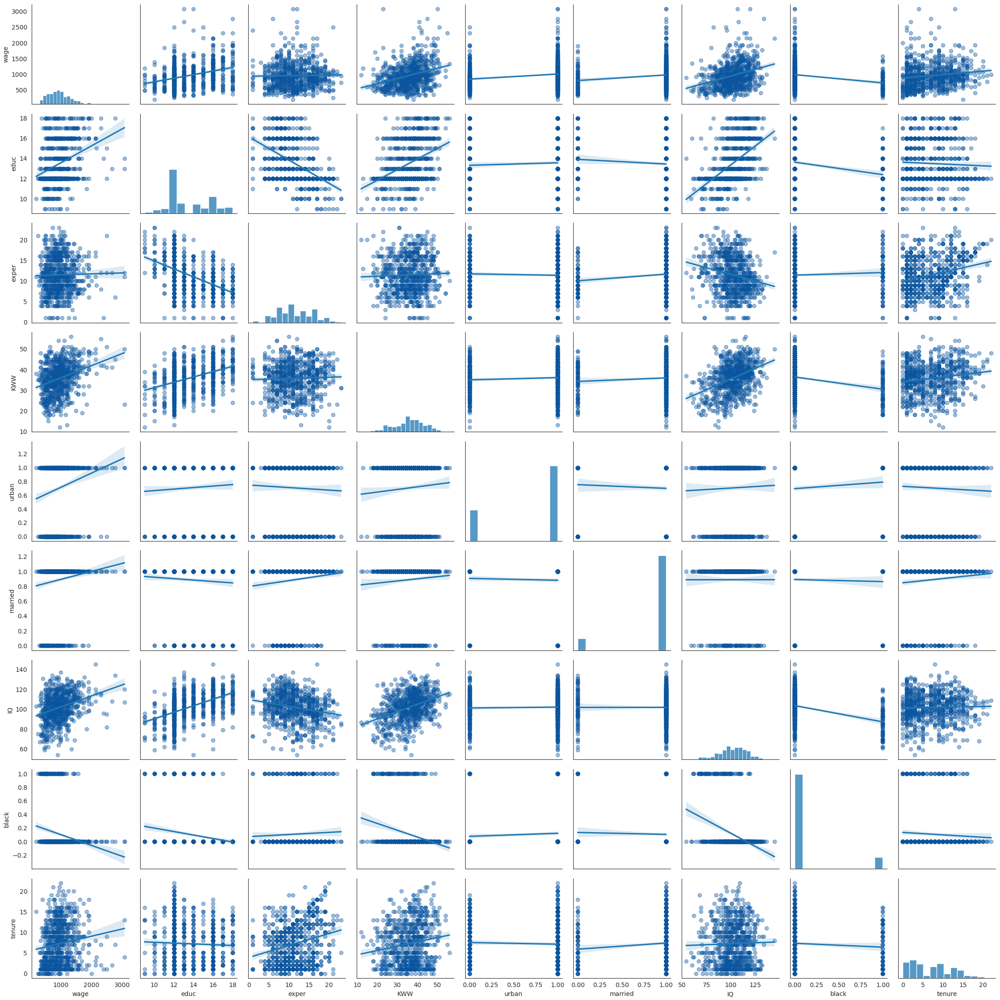

In [69]:
# Variables used in final MLR model
mlr_vars = ['wage', 'educ', 'exper', 'KWW', 'urban', 'married', 'IQ', 'black', 'tenure']

# Pairplot: Visualize scatterplots + trend lines
with sns.axes_style('white'):
    g = sns.pairplot(train[mlr_vars], kind='reg',
                     plot_kws={'scatter_kws': {'color': sns.color_palette('Blues')[-1], 'alpha': 0.4}})
plt.tight_layout()
plt.show()

C:\Users\aiden\AppData\Local\Temp\ipykernel_29204\2546418093.py:35: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='urban', y='wage', data=train, palette='Blues')
C:\Users\aiden\AppData\Local\Temp\ipykernel_29204\2546418093.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='married', y='wage', data=train, palette='Blues')
C:\Users\aiden\AppData\Local\Temp\ipykernel_29204\2546418093.py:43: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='black', y='wage', data=train, palette='Blues')


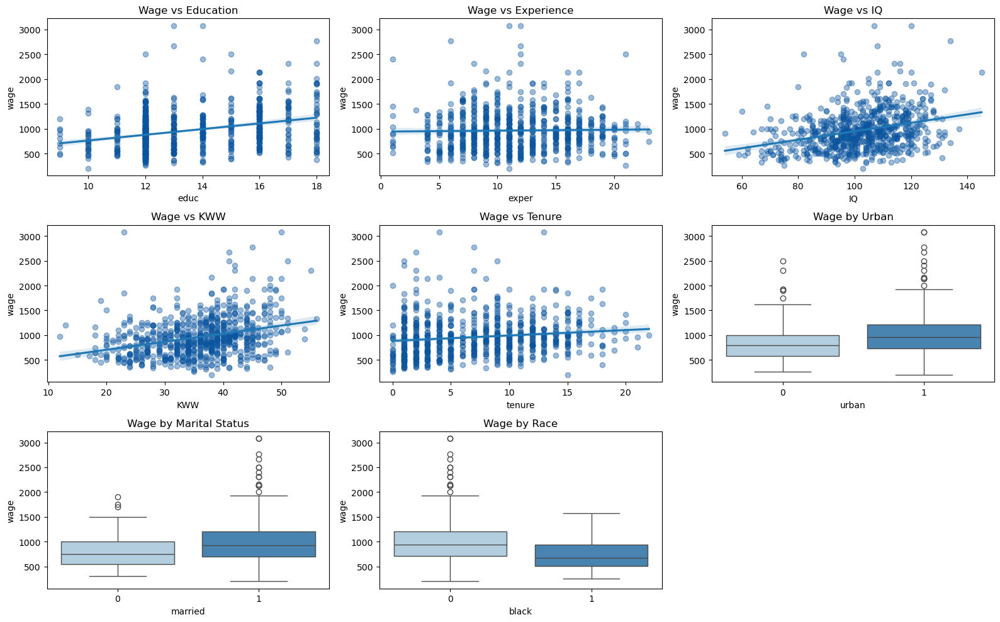

In [70]:
plt.figure(figsize=(16, 10))

# Wage vs Education
plt.subplot(3, 3, 1)
sns.regplot(x='educ', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs Education')

# Wage vs Experience
plt.subplot(3, 3, 2)
sns.regplot(x='exper', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs Experience')

# Wage vs IQ
plt.subplot(3, 3, 3)
sns.regplot(x='IQ', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs IQ')

# Wage vs KWW
plt.subplot(3, 3, 4)
sns.regplot(x='KWW', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs KWW')

# Wage vs Tenure
plt.subplot(3, 3, 5)
sns.regplot(x='tenure', y='wage', data=train,
            scatter_kws={'color': sns.color_palette('Blues')[-1], 'alpha': 0.4})
plt.title('Wage vs Tenure')

# Categorical (urban, married, black) use boxplot instead
plt.subplot(3, 3, 6)
sns.boxplot(x='urban', y='wage', data=train, palette='Blues')
plt.title('Wage by Urban')

plt.subplot(3, 3, 7)
sns.boxplot(x='married', y='wage', data=train, palette='Blues')
plt.title('Wage by Marital Status')

plt.subplot(3, 3, 8)
sns.boxplot(x='black', y='wage', data=train, palette='Blues')
plt.title('Wage by Race')

plt.tight_layout()
plt.show()

### LSA 2: Exogeneity

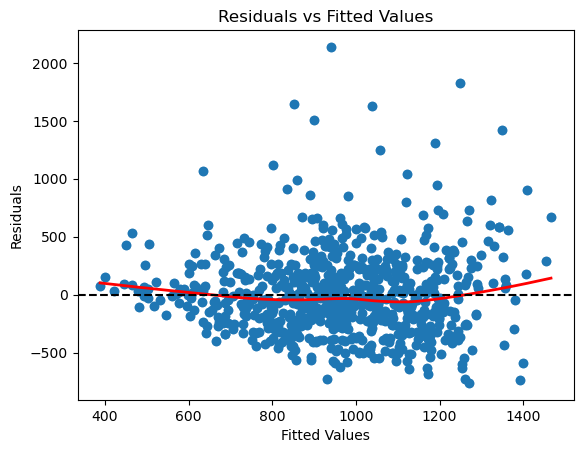

In [72]:
# Scatterplot of residuals vs fitted values
t3_fit = t3_mlr_final.fittedvalues
t3_resid = t3_mlr_final.resid

sns.regplot(x=t3_fit, y=t3_resid, lowess=True,
            scatter_kws={'s': 35, 'alpha': 0.6},
            line_kws={'color': 'red', 'linewidth': 2})
plt.scatter(t3_fit, t3_resid)
plt.axhline(0, color='black', linestyle='--')
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Residuals vs Fitted Values")
plt.show()

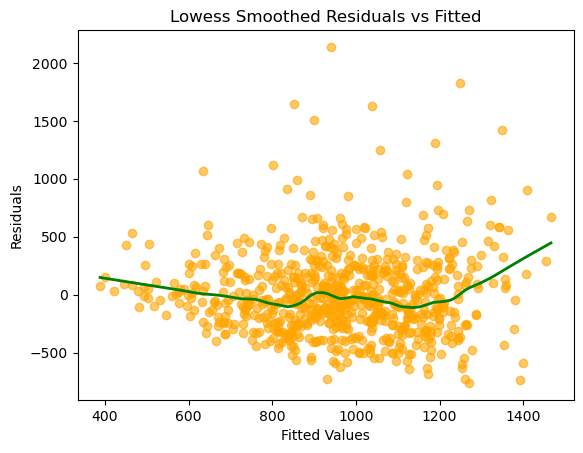

In [73]:
lowess = sm.nonparametric.lowess
plt.scatter(t3_fit, t3_resid, color='orange', alpha=0.6)
t3_z = lowess(t3_resid, t3_fit, frac=1./5)
plt.plot(t3_z[:, 0], t3_z[:, 1], color='green', linewidth=2)
plt.title("Lowess Smoothed Residuals vs Fitted")
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.show()

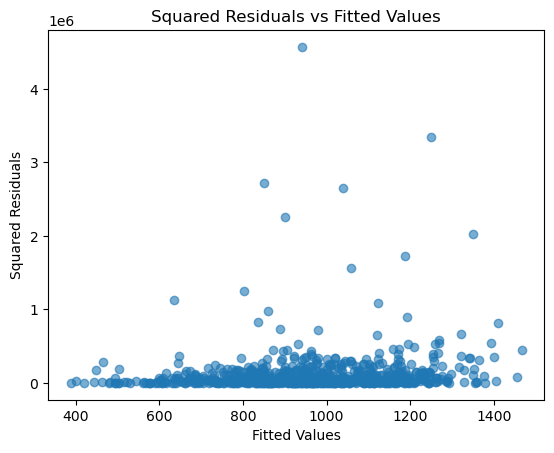

In [74]:
t3_resid2 = t3_resid ** 2

plt.scatter(t3_fit, t3_resid2, alpha=0.6)
plt.title("Squared Residuals vs Fitted Values")
plt.xlabel("Fitted Values")
plt.ylabel("Squared Residuals")
plt.show()

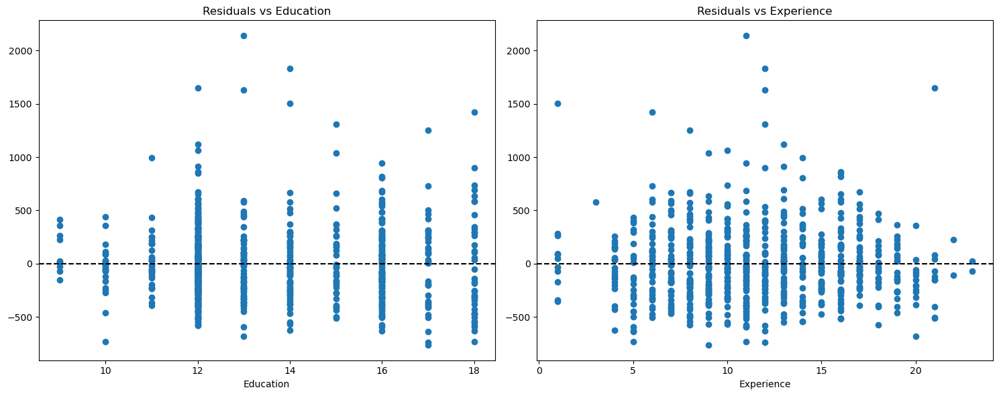

In [75]:
fig = plt.figure(figsize=(15, 6))
ax1 = fig.add_subplot(1, 2, 1)
ax2 = fig.add_subplot(1, 2, 2)

ax1.scatter(train['educ'], t3_resid)
ax1.axhline(0, color='black', linestyle='--')
ax1.set_title("Residuals vs Education")
ax1.set_xlabel("Education")

ax2.scatter(train['exper'], t3_resid)
ax2.axhline(0, color='black', linestyle='--')
ax2.set_title("Residuals vs Experience")
ax2.set_xlabel("Experience")

plt.tight_layout()
plt.show()

### LSA 5

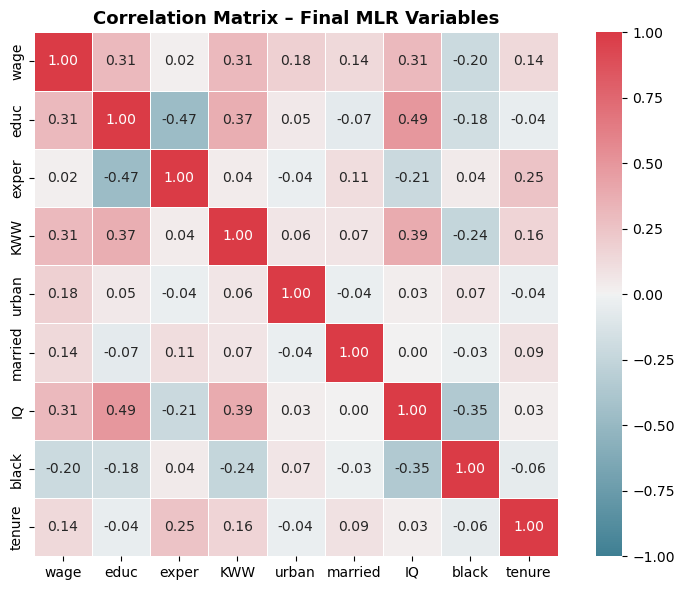

In [77]:
# Variables used in MLR model
mlr_vars = ['wage', 'educ', 'exper', 'KWW', 'urban', 'married', 'IQ', 'black', 'tenure']

# Compute correlation matrix
fig, ax = plt.subplots(figsize=(8, 6))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(train[mlr_vars].corr(),
            vmax=1, vmin=-1, center=0,
            square=True, linewidths=0.5, annot=True, fmt='.2f',
            cmap=cmap, ax=ax)

ax.set_title('Correlation Matrix – Final MLR Variables', fontweight='bold', fontsize=13)
plt.tight_layout()
plt.savefig('t3_mlr_correlation_matrix.png', dpi=300)
plt.show()

### LSA 6

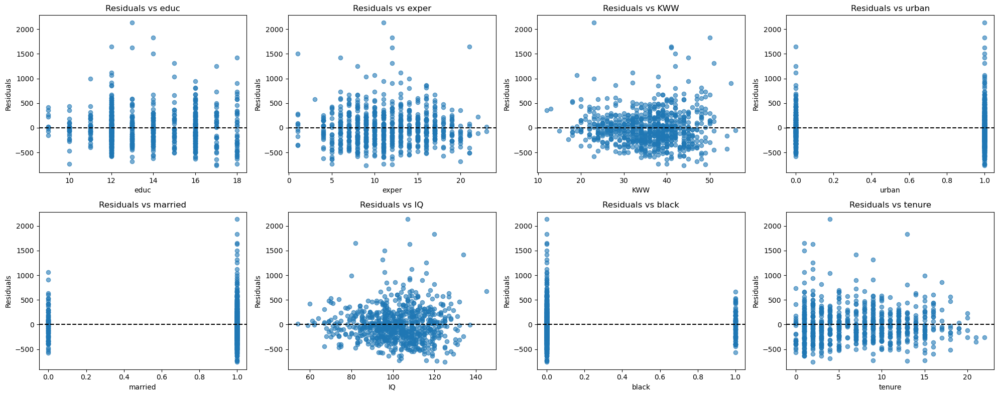

In [79]:
# Residuals from Task 3 model
t3_resid = t3_mlr_final.resid

# Predictor variables from the final model
predictors = ['educ', 'exper', 'KWW', 'urban', 'married', 'IQ', 'black', 'tenure']

# Create subplots: 2 rows × 4 columns for 8 predictors
fig, axes = plt.subplots(2, 4, figsize=(20, 8))
axes = axes.flatten()

# Loop through variables and create scatter plots
for i, var in enumerate(predictors):
    axes[i].scatter(train[var], t3_resid, alpha=0.6)
    axes[i].axhline(0, color='black', linestyle='--')
    axes[i].set_title(f"Residuals vs {var}")
    axes[i].set_xlabel(var)
    axes[i].set_ylabel("Residuals")

plt.tight_layout()
plt.savefig("lsa6_residuals_vs_predictors.png", dpi=300)
plt.show()

In [80]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
# 1. Define your predictor variables
predictors = ['educ', 'exper', 'KWW', 'urban', 'married', 'IQ', 'black', 'tenure']

# 2. Add constant for intercept
X = train[predictors]
X = sm.add_constant(X)

# 3. Calculate VIF for each variable
vif_data = pd.DataFrame()
vif_data["Variable"] = X.columns
vif_data["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

# 4. Display the VIF table
print(vif_data)

  Variable         VIF
0    const  116.517412
1     educ    1.811072
2    exper    1.462016
3      KWW    1.378618
4    urban    1.016170
5  married    1.025257
6       IQ    1.536760
7    black    1.172122
8   tenure    1.101848


# **Task 4**

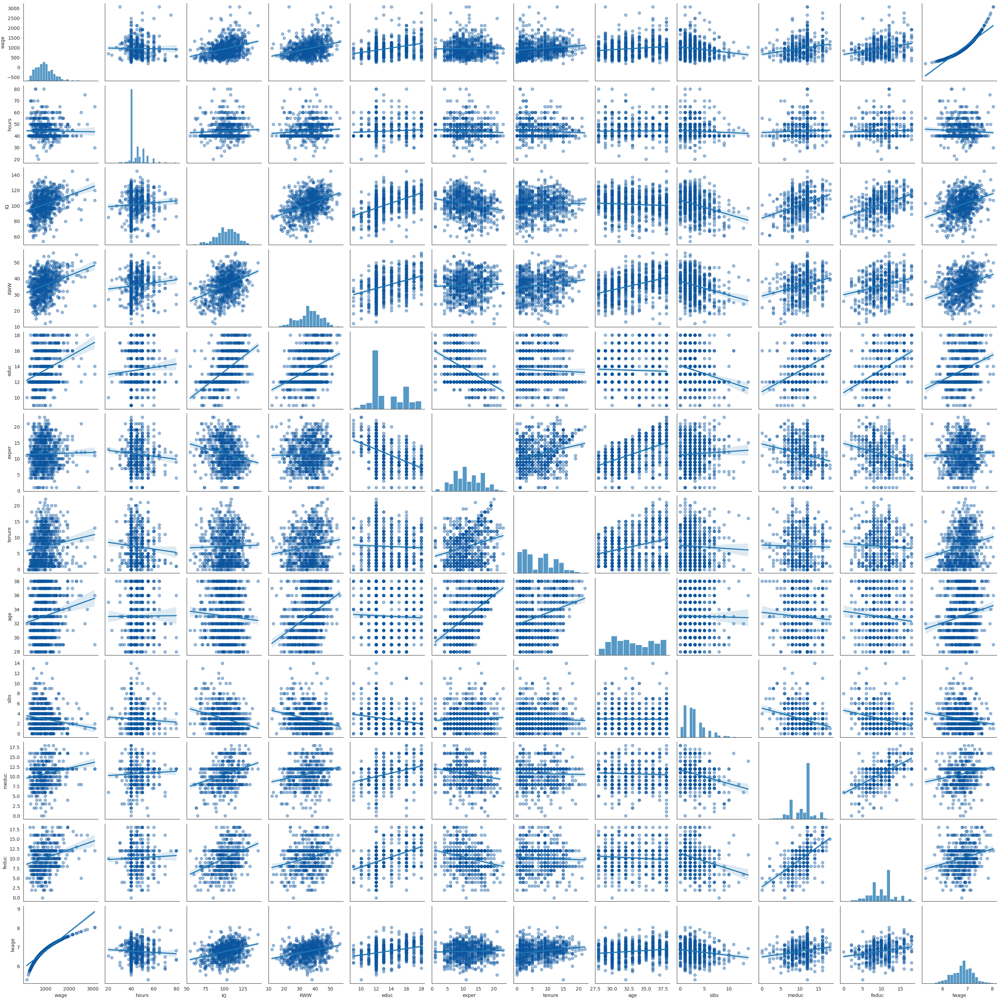

In [82]:
variables=['wage', 'hours', 'IQ', 'KWW', 'educ', 'exper', 'tenure', 'age', 'sibs', 'meduc', 'feduc', 'lwage']
with sns.axes_style('white'):
    g=sns.pairplot(train[variables], kind='reg', 
                   plot_kws={'scatter_kws' :{'color': sns.color_palette('Blues')[-1], 'alpha': 0.4}})

### Model 0 - Base Model

In [84]:
model = smf.ols('wage ~ educ + exper', data=train).fit(cov_type = 'HC0')
model0= model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.133
Model:                            OLS   Adj. R-squared:                  0.130
Method:                 Least Squares   F-statistic:                     47.42
Date:                Fri, 30 May 2025   Prob (F-statistic):           4.36e-20
Time:                        15:44:21   Log-Likelihood:                -5384.0
No. Observations:                 733   AIC:                         1.077e+04
Df Residuals:                     730   BIC:                         1.079e+04
Df Model:                           2                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -288.7780    128.375     -2.249      0.024    -540.388     -37.168
educ          76.1294      7.848      9.700      0.000      60.747      91.512
exper         19.4915      3.479      5.603      0.000      12.673      26.310
==============================================================================
Omnibus:                      191.273   Durbin-Watson:                   1.975
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              647.797
Skew:                           1.221   Prob(JB):                    2.15e-141
Kurtosis:                       6.905   Cond. No.                         159.
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
"""

In [85]:
model.mse_resid**0.5

375.5059302119657

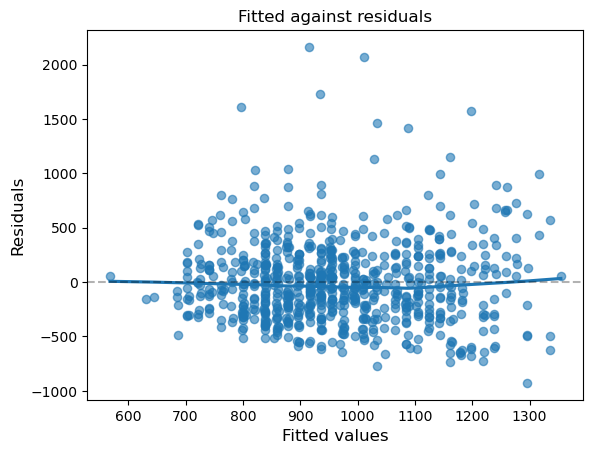

In [86]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.show()

In [87]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model0 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  8   9  13  57  96 124 151 161 178 183 185 188 200 214 266 271 311 385
 405 415 426 454 482 483 487 491 493 516 536 537 540 576 582 647 656 677
 683 686 700 708]
Influential points based on DFBETAS:
[  8   8   9  13  13  26  29  29  35  35  52  52  57  63  79  79  87  96
  96  96 112 124 146 146 151 151 151 153 153 161 161 178 178 183 183 183
 185 185 188 188 198 200 214 214 214 217 224 227 227 230 230 266 266 271
 271 286 296 311 311 311 323 327 385 385 405 405 405 414 414 414 426 426
 433 449 449 454 481 481 482 482 482 483 486 491 491 493 511 516 516 516
 530 531 531 531 536 536 536 537 537 537 540 540 540 564 564 572 572 576
 576 582 601 601 605 609 640 647 647 656 683 683 686 686 686 700 700 700
 708 708 714 721 724]
Influential points based on DFFITS:
[  8   9  13  57  96 124 151 161 178 183 185 188 200 214 266 271 311 385
 405 415 426 454 482 483 487 491 493 516 536 537 540 576 582 647 656 677
 683 686 700 708]




### Model 1 - Increased Number of Variables

In [89]:
model = smf.ols('wage ~ educ + exper + KWW + urban + married + IQ + black + tenure', data=train).fit(cov_type = 'HC0')
model1=model 
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.237
Model:                            OLS   Adj. R-squared:                  0.228
Method:                 Least Squares   F-statistic:                     29.21
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.26e-39
Time:                        15:44:22   Log-Likelihood:                -5337.2
No. Observations:                 733   AIC:                         1.069e+04
Df Residuals:                     724   BIC:                         1.073e+04
Df Model:                           8                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -683.0066    141.388     -4.831      0.000    -960.122    -405.891
educ          48.8057      8.333      5.857      0.000      32.474      65.138
exper         13.0178      3.588      3.628      0.000       5.985      20.051
KWW            5.2590      2.257      2.330      0.020       0.835       9.683
urban        157.2883     27.077      5.809      0.000     104.218     210.359
married      165.1190     38.213      4.321      0.000      90.224     240.014
IQ             3.5124      1.087      3.230      0.001       1.381       5.644
black       -124.6535     36.259     -3.438      0.001    -195.719     -53.588
tenure         6.5538      2.783      2.355      0.019       1.099      12.008
==============================================================================
Omnibus:                      214.829   Durbin-Watson:                   1.948
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              821.979
Skew:                           1.332   Prob(JB):                    3.23e-179
Kurtosis:                       7.452   Cond. No.                     1.20e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.2e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [90]:
model.mse_resid**0.5

353.7382125538841

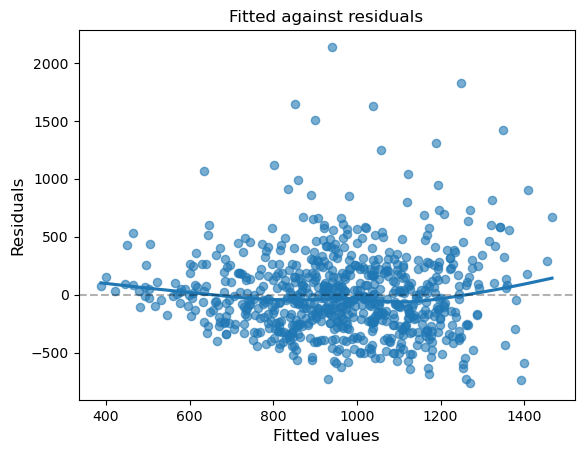

In [91]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--') 
plt.savefig('Model 1 resid') 
plt.show()


In [92]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model1 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  8   9  10  13  29  35  57  96 111 161 178 183 185 230 266 271 289 301
 311 317 343 396 405 426 487 536 537 540 598 639 647 667 677 683]
Influential points based on DFBETAS:
[  0   8   8   8   8   8   9   9   9   9   9   9  10  10  10  10  13  13
  13  13  18  22  26  26  27  29  29  29  29  29  29  35  35  35  35  38
  47  47  54  55  55  57  57  57  58  61  79  79  79  88  94  95  96  96
  96 111 111 111 112 115 115 124 130 130 136 136 139 139 141 141 146 146
 151 151 151 151 153 153 161 161 161 168 178 178 178 178 183 183 183 183
 185 185 185 188 188 192 194 194 198 199 200 200 200 202 207 210 210 210
 214 214 214 215 217 217 218 224 224 227 227 230 230 230 230 233 233 235
 235 244 244 247 251 252 255 255 266 266 266 271 271 271 271 271 271 274
 285 286 286 289 289 289 289 293 296 301 301 301 307 307 311 311 311 311
 311 311 311 311 311 317 317 317 323 327 327 338 338 338 338 343 343 343
 343 345 345 346 347 358 358 358 363 365 374 381 

In [93]:
#Potential Interaction effects
educ_IQ = train['educ'] * train['IQ']
educ_KWW = train['educ'] * train['KWW'] #Significant
urban_married = train['urban'] * train['married']
exper_tenure = train['exper'] * train['tenure']
KWW_black = train['KWW'] * train['black']
tenure_married = train['tenure'] * train['married']
black_urban = train['black'] * train['urban']
exper_urban = train['exper'] * train['urban']
exper_black = train['exper'] * train['black']
IQ_urban = train['IQ'] * train['urban']
IQ_married = train['IQ'] * train['married']
IQ_exper = train['IQ'] * train['exper']
IQ_tenure = train['IQ'] * train['tenure']
black_married = train['black'] * train['married']
black_tenure = train['black'] * train['tenure'] #Significant
educ_urban = train['educ'] * train['urban']
educ_black = train['educ'] * train['black']

### Model 2 - Log Wage Increased Number of Variables

In [95]:
def forward_selected(data, response, nominated = []):
    """Linear model designed by forward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by forward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    selected = nominated
    remaining.remove(response)
    remaining ^= set(selected)
    current_score, best_new_score = 0.0, 0.0
    if nominated:
        formula = "{} ~ {} + 1".format(response, ' + '.join(nominated))
        current_score= smf.ols(formula, data).fit().rsquared_adj
        best_new_score = current_score
        print("you nominated variable(s) %s, the adj_r2 is: %f" %(nominated, current_score))
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("adding %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [96]:
df = train[['lwage', 'educ', 'exper', 'hours', 'IQ', 'KWW', 'tenure', 'age', 'married', 'black', 'south', 'urban', 'sibs', 'meduc', 'feduc']]

In [97]:
model = forward_selected(df, 'lwage')

adding IQ increases adj_r2 from 0.000000 to 0.102645
adding tenure increases adj_r2 from 0.102645 to 0.136089
adding urban increases adj_r2 from 0.136089 to 0.171899
adding educ increases adj_r2 from 0.171899 to 0.198809
adding married increases adj_r2 from 0.198809 to 0.224029
adding exper increases adj_r2 from 0.224029 to 0.243531
adding black increases adj_r2 from 0.243531 to 0.257825
adding hours increases adj_r2 from 0.257825 to 0.265998
adding south increases adj_r2 from 0.265998 to 0.268653
adding KWW increases adj_r2 from 0.268653 to 0.271410
adding age increases adj_r2 from 0.271410 to 0.271692
final model is lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + south + KWW + age + 1, with adj_r2 of 0.271692


In [98]:
model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours', data=train).fit(cov_type = 'HC0')
model2=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.266
Method:                 Least Squares   F-statistic:                     38.44
Date:                Fri, 30 May 2025   Prob (F-statistic):           4.80e-51
Time:                        15:44:23   Log-Likelihood:                -272.10
No. Observations:                 733   AIC:                             562.2
Df Residuals:                     724   BIC:                             603.6
Df Model:                           8                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.2949      0.171     31.038      0.000       4.961       5.629
IQ             0.0046      0.001      4.309      0.000       0.003       0.007
tenure         0.0112      0.003      4.011      0.000       0.006       0.017
urban          0.1835      0.029      6.434      0.000       0.128       0.239
educ           0.0537      0.008      6.450      0.000       0.037       0.070
married        0.2031      0.044      4.627      0.000       0.117       0.289
exper          0.0149      0.004      4.124      0.000       0.008       0.022
black         -0.1845      0.043     -4.260      0.000      -0.269      -0.100
hours         -0.0056      0.002     -2.497      0.013      -0.010      -0.001
==============================================================================
Omnibus:                        7.345   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.025   Jarque-Bera (JB):               10.465
Skew:                           0.004   Prob(JB):                      0.00534
Kurtosis:                       3.585   Cond. No.                     1.41e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.41e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [99]:
model.mse_resid**0.5

0.3529096367915573

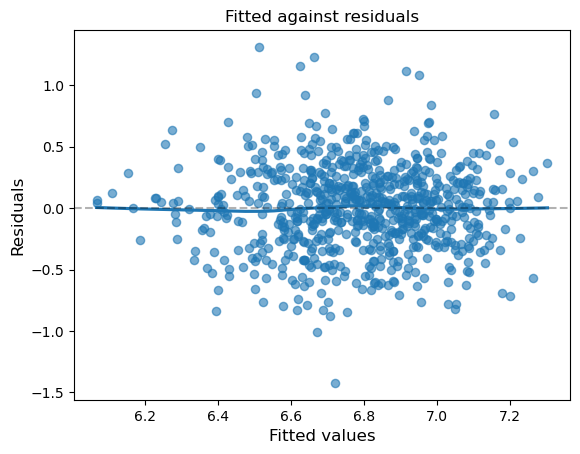

In [100]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--') 
plt.savefig('Model 2 resid') 
plt.show()

In [101]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model2 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  9  10  13  29  35  55 111 115 130 178 194 230 255 256 266 286 289 307
 311 338 343 435 454 481 483 487 493 510 537 562 591 598 609 617 639 647
 651 653 656 663 667 675 677 683 721]
Influential points based on DFBETAS:
[  0   0   8   8   8   9   9   9   9  10  10  10  13  13  13  14  18  21
  22  27  29  29  29  29  29  35  35  35  35  38  47  47  54  55  55  55
  57  57  58  61  61  63  72  79  79  79  81  82  82  85  88  94  94  95
  96  96  96  99 107 107 111 111 114 114 115 115 115 115 126 127 130 130
 130 130 133 136 136 136 138 139 139 139 141 141 146 151 153 153 160 161
 163 164 164 168 172 178 178 183 183 183 183 185 185 187 188 188 194 194
 194 199 199 200 200 200 207 210 210 210 214 214 214 217 218 220 220 224
 227 227 227 229 230 230 230 230 230 230 233 233 235 235 244 247 247 250
 251 251 252 255 255 255 256 256 266 266 266 268 268 270 271 271 271 271
 274 285 286 286 286 286 286 289 289 289 289 293 296 300 301 301 301 307
 307

### Model 3 - Log Model with Interaction Effects

In [103]:
model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + educ_IQ', data=train).fit(cov_type = 'HC0')
model3=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.265
Method:                 Least Squares   F-statistic:                     35.89
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.38e-52
Time:                        15:44:24   Log-Likelihood:                -272.06
No. Observations:                 733   AIC:                             564.1
Df Residuals:                     723   BIC:                             610.1
Df Model:                           9                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.4697      0.617      8.861      0.000       4.260       6.680
IQ             0.0029      0.006      0.499      0.618      -0.009       0.015
tenure         0.0113      0.003      4.011      0.000       0.006       0.017
urban          0.1841      0.029      6.411      0.000       0.128       0.240
educ           0.0403      0.047      0.853      0.393      -0.052       0.133
married        0.2036      0.044      4.634      0.000       0.117       0.290
exper          0.0148      0.004      4.097      0.000       0.008       0.022
black         -0.1856      0.043     -4.273      0.000      -0.271      -0.100
hours         -0.0056      0.002     -2.496      0.013      -0.010      -0.001
educ_IQ        0.0001      0.000      0.281      0.779      -0.001       0.001
==============================================================================
Omnibus:                        7.459   Durbin-Watson:                   2.018
Prob(Omnibus):                  0.024   Jarque-Bera (JB):               10.679
Skew:                           0.005   Prob(JB):                      0.00480
Kurtosis:                       3.591   Cond. No.                     7.03e+04
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 7.03e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [104]:
model.mse_resid**0.5

0.35313376418853243

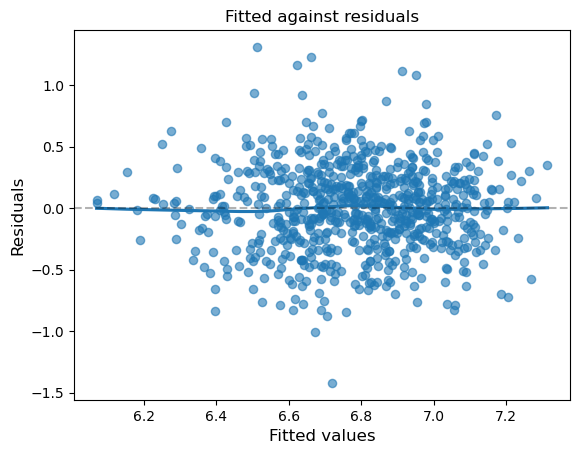

In [105]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--') 
plt.savefig('Model 3 resid') 
plt.show()

In [106]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model3 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  9  10  13  29  35  55 111 115 130 161 178 194 227 230 255 256 266 271
 286 289 307 311 338 343 410 435 454 481 483 487 493 510 537 562 591 598
 609 617 639 647 651 653 656 663 667 675 677 683]
Influential points based on DFBETAS:
[  0   0   8   9   9   9  10  13  13  13  14  18  21  22  22  22  22  27
  29  29  29  35  35  38  47  47  54  55  55  55  55  57  57  57  58  61
  63  63  63  63  72  79  79  81  82  84  84  84  84  85  88  94  94  95
  96  96  96  96  99 107 111 111 111 111 111 111 114 114 115 115 115 115
 115 126 126 126 126 127 130 130 136 136 136 138 138 138 139 139 139 141
 141 146 151 153 153 160 161 161 161 161 161 161 164 164 172 178 178 178
 178 183 183 185 185 185 187 188 194 194 194 194 199 199 199 200 200 200
 200 207 210 210 214 214 214 214 217 218 220 220 224 227 227 227 227 227
 229 230 230 230 230 233 233 233 233 235 235 244 247 247 250 251 252 255
 255 255 256 256 263 266 266 266 266 266 266 268 270 271 271 271 

### Model 4 - Log Model with Interaction Effect

In [108]:
model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + black_tenure', data=train).fit(cov_type = 'HC0')
model4=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.279
Model:                            OLS   Adj. R-squared:                  0.270
Method:                 Least Squares   F-statistic:                     34.42
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.23e-50
Time:                        15:44:25   Log-Likelihood:                -269.74
No. Observations:                 733   AIC:                             559.5
Df Residuals:                     723   BIC:                             605.4
Df Model:                           9                                         
Covariance Type:                  HC0                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.3145      0.171     31.027      0.000       4.979       5.650
IQ               0.0046      0.001      4.286      0.000       0.002       0.007
tenure           0.0094      0.003      3.205      0.001       0.004       0.015
urban            0.1831      0.028      6.443      0.000       0.127       0.239
educ             0.0536      0.008      6.490      0.000       0.037       0.070
married          0.1962      0.044      4.460      0.000       0.110       0.282
exper            0.0151      0.004      4.210      0.000       0.008       0.022
black           -0.3063      0.075     -4.100      0.000      -0.453      -0.160
hours           -0.0055      0.002     -2.457      0.014      -0.010      -0.001
black_tenure     0.0186      0.008      2.448      0.014       0.004       0.034
==============================================================================
Omnibus:                        7.241   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.027   Jarque-Bera (JB):               10.265
Skew:                           0.007   Prob(JB):                      0.00590
Kurtosis:                       3.580   Cond. No.                     1.42e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.42e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [109]:
model.mse_resid**0.5

0.35201504549689316

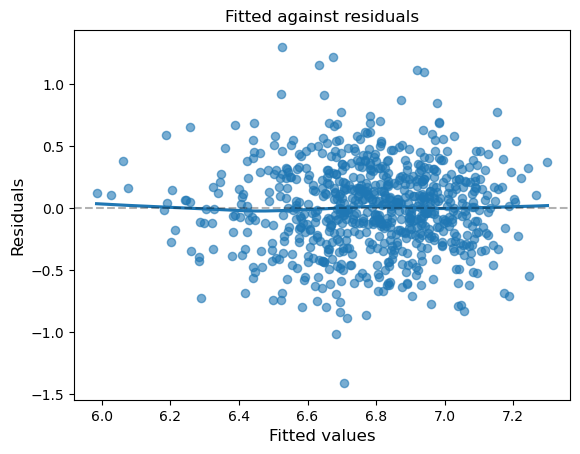

In [110]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--') 
plt.savefig('Model 4 resid') 
plt.show()

In [111]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model4 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  9  10  13  14  29  35  55 111 114 115 130 178 194 230 256 266 285 286
 289 307 311 343 435 454 483 487 490 493 510 537 548 562 591 598 617 639
 647 651 653 656 663 667 675 677 683 721 732]
Influential points based on DFBETAS:
[  0   0   0   2   8   8   8   9   9   9   9  10  10  10  13  13  13  14
  14  18  21  22  27  29  29  29  29  29  35  35  35  35  38  47  47  54
  55  55  57  57  58  58  61  63  72  79  79  79  81  82  82  85  88  94
  94  95  96  96  96  99 107 107 111 111 114 114 114 114 115 115 115 115
 126 127 130 130 130 130 136 136 138 139 141 141 151 153 153 160 161 163
 164 164 168 172 178 178 183 183 183 183 185 185 187 187 187 188 188 190
 194 194 194 194 199 199 200 200 200 207 210 210 210 214 214 214 217 218
 220 220 224 227 227 227 230 230 230 230 230 230 230 233 233 235 235 244
 247 247 250 251 251 252 255 255 255 256 256 266 266 266 268 268 271 271
 271 274 285 285 286 286 286 286 286 289 289 289 289 293 296 300 300 

### Model 5 - Log Model with Spline KWW

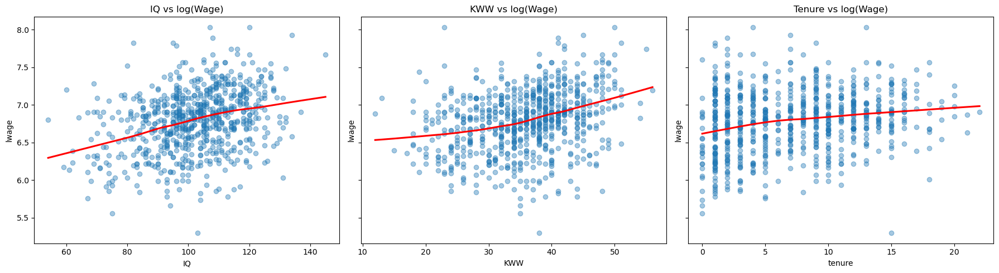

In [113]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=True)

# IQ vs lwage with LOWESS
sns.regplot(data=train, x='IQ', y='lwage', ax=axes[0], lowess=True,
            scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'})
axes[0].set_title('IQ vs log(Wage)')

# KWW vs lwage with LOWESS
sns.regplot(data=train, x='KWW', y='lwage', ax=axes[1], lowess=True,
            scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'})
axes[1].set_title('KWW vs log(Wage)')

# Tenure vs lwage with LOWESS
sns.regplot(data=train, x='tenure', y='lwage', ax=axes[2], lowess=True,
            scatter_kws={'alpha': 0.4}, line_kws={'color': 'red'})
axes[2].set_title('Tenure vs log(Wage)')

# Layout adjustment
plt.tight_layout()
plt.savefig('non-linearity')
plt.show()

In [114]:
xi = 34

# Create the spline variable (positive part only)
train['KWW_step'] = (train['KWW'] > xi) * (train['KWW'] - xi)

In [115]:
model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + KWW + KWW_step', data=train).fit(cov_type = 'HC0')
model5=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.287
Model:                            OLS   Adj. R-squared:                  0.277
Method:                 Least Squares   F-statistic:                     33.14
Date:                Fri, 30 May 2025   Prob (F-statistic):           4.41e-53
Time:                        15:44:26   Log-Likelihood:                -265.37
No. Observations:                 733   AIC:                             552.7
Df Residuals:                     722   BIC:                             603.3
Df Model:                          10                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.6399      0.196     28.805      0.000       5.256       6.024
IQ             0.0043      0.001      3.989      0.000       0.002       0.006
tenure         0.0100      0.003      3.511      0.000       0.004       0.016
urban          0.1773      0.028      6.284      0.000       0.122       0.233
educ           0.0462      0.009      5.301      0.000       0.029       0.063
married        0.2013      0.043      4.731      0.000       0.118       0.285
exper          0.0127      0.004      3.467      0.001       0.006       0.020
black         -0.1886      0.045     -4.168      0.000      -0.277      -0.100
hours         -0.0061      0.002     -2.806      0.005      -0.010      -0.002
KWW           -0.0063      0.004     -1.638      0.101      -0.014       0.001
KWW_step       0.0186      0.006      3.117      0.002       0.007       0.030
==============================================================================
Omnibus:                        7.042   Durbin-Watson:                   2.004
Prob(Omnibus):                  0.030   Jarque-Bera (JB):                9.580
Skew:                          -0.055   Prob(JB):                      0.00831
Kurtosis:                       3.549   Cond. No.                     1.78e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.78e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [116]:
model.mse_resid**0.5

0.35016607066157124

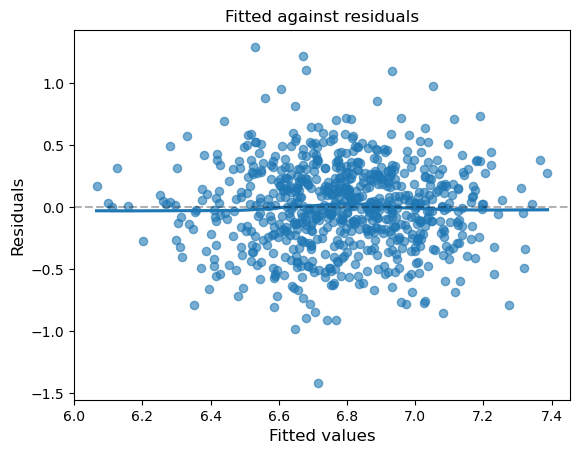

In [117]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.savefig('Model 5 resid')
plt.show()

In [118]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model5 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  9  10  13  29  35  55 111 115 130 185 194 200 227 230 252 255 266 271
 286 289 307 311 338 343 358 396 410 435 483 487 490 493 537 545 562 591
 598 617 639 647 651 653 656 663 667 675 677 683 721]
Influential points based on DFBETAS:
[  0   0   2   2   8   8   9   9   9   9   9   9   9   9   9  10  10  10
  13  13  13  14  18  22  26  26  27  27  27  28  29  29  29  29  29  29
  35  35  35  35  35  38  47  47  54  55  55  55  55  55  57  57  58  61
  61  72  79  79  79  81  82  82  85  94  95  96  99 107 107 107 107 107
 111 111 114 114 115 115 115 115 117 127 130 130 130 130 136 136 136 138
 139 139 139 141 141 145 146 146 153 153 153 160 160 160 160 160 161 165
 168 168 172 172 178 178 183 183 185 185 185 186 186 186 187 188 188 190
 192 194 194 194 199 200 200 200 200 202 202 202 205 207 210 210 210 214
 214 214 217 220 224 227 227 230 230 230 230 230 230 230 230 233 233 233
 233 234 234 234 235 235 237 244 247 247 250 251 251 252 252 

### Model 6 - Log Model with Spline IQ

In [120]:
xi = 105

# Create the spline term: positive part after the knot
train['IQ_step'] = (train['IQ'] > xi) * (train['IQ'] - xi)

In [121]:
model = smf.ols('lwage ~ IQ + IQ_step + tenure + urban + educ + married + exper + black + hours', data=train).fit(cov_type = 'HC0')
model6=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.274
Model:                            OLS   Adj. R-squared:                  0.265
Method:                 Least Squares   F-statistic:                     34.72
Date:                Fri, 30 May 2025   Prob (F-statistic):           4.96e-51
Time:                        15:44:27   Log-Likelihood:                -272.08
No. Observations:                 733   AIC:                             564.2
Df Residuals:                     723   BIC:                             610.1
Df Model:                           9                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.3162      0.189     28.076      0.000       4.945       5.687
IQ             0.0044      0.002      2.719      0.007       0.001       0.008
IQ_step        0.0006      0.003      0.192      0.848      -0.006       0.007
tenure         0.0113      0.003      4.019      0.000       0.006       0.017
urban          0.1836      0.029      6.427      0.000       0.128       0.240
educ           0.0535      0.008      6.496      0.000       0.037       0.070
married        0.2038      0.044      4.615      0.000       0.117       0.290
exper          0.0149      0.004      4.131      0.000       0.008       0.022
black         -0.1859      0.044     -4.264      0.000      -0.271      -0.100
hours         -0.0056      0.002     -2.493      0.013      -0.010      -0.001
==============================================================================
Omnibus:                        7.365   Durbin-Watson:                   2.017
Prob(Omnibus):                  0.025   Jarque-Bera (JB):               10.502
Skew:                           0.005   Prob(JB):                      0.00524
Kurtosis:                       3.586   Cond. No.                     1.71e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.71e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [122]:
model.mse_resid**0.5

0.35314479898937007

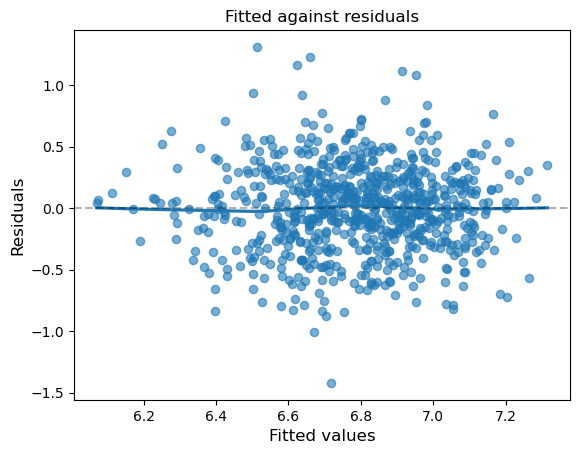

In [123]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')
plt.savefig('Model 6 resid')  
plt.show()

In [124]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model6 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  9  10  13  29  35  55  96 111 115 130 178 194 230 255 256 266 286 289
 307 311 343 410 435 454 481 483 487 493 510 516 526 537 562 591 598 617
 639 647 651 653 656 663 667 675 677 683 721]
Influential points based on DFBETAS:
[  0   0   8   8   8   8   9   9   9   9   9  10  10  10  10  13  13  13
  14  14  18  21  22  27  29  29  29  29  33  35  35  35  35  35  38  38
  47  47  54  55  55  55  55  55  57  58  61  61  72  79  79  81  82  85
  88  94  94  94  95  96  96  99 107 111 111 114 114 115 115 115 126 126
 127 130 130 130 130 130 133 136 136 136 136 138 139 139 139 141 141 146
 151 151 153 153 160 161 161 161 164 164 168 168 172 178 178 183 185 187
 188 188 188 190 194 194 194 199 200 200 207 210 210 210 214 214 214 217
 218 220 220 224 227 227 227 230 230 230 230 230 230 230 233 233 233 233
 235 235 244 247 247 250 251 252 252 255 255 255 256 256 266 266 266 268
 268 270 271 271 271 271 271 274 285 286 286 286 289 289 289 289 289 

### Model 7 - Log Model with Spline Tenure

In [126]:
xi1 = 5

# Create piecewise linear spline terms
train['tenure_step'] = (train['tenure'] > xi1) * (train['tenure'] - xi1)

In [127]:
model = smf.ols('lwage ~ IQ + tenure + tenure_step + urban + educ + married + exper + black + hours', data=train).fit(cov_type = 'HC0')
model7=model
model.summary() 

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.277
Model:                            OLS   Adj. R-squared:                  0.268
Method:                 Least Squares   F-statistic:                     34.69
Date:                Fri, 30 May 2025   Prob (F-statistic):           5.44e-51
Time:                        15:44:28   Log-Likelihood:                -270.80
No. Observations:                 733   AIC:                             561.6
Df Residuals:                     723   BIC:                             607.6
Df Model:                           9                                         
Covariance Type:                  HC0                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       5.2541      0.173     30.446      0.000       4.916       5.592
IQ              0.0047      0.001      4.360      0.000       0.003       0.007
tenure          0.0266      0.011      2.420      0.016       0.005       0.048
tenure_step    -0.0206      0.013     -1.535      0.125      -0.047       0.006
urban           0.1847      0.028      6.482      0.000       0.129       0.241
educ            0.0529      0.008      6.377      0.000       0.037       0.069
married         0.2022      0.044      4.641      0.000       0.117       0.288
exper           0.0153      0.004      4.216      0.000       0.008       0.022
black          -0.1832      0.043     -4.268      0.000      -0.267      -0.099
hours          -0.0056      0.002     -2.512      0.012      -0.010      -0.001
==============================================================================
Omnibus:                        7.873   Durbin-Watson:                   2.010
Prob(Omnibus):                  0.020   Jarque-Bera (JB):               11.338
Skew:                           0.034   Prob(JB):                      0.00345
Kurtosis:                       3.605   Cond. No.                     1.43e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.43e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [128]:
model.mse_resid**0.5

0.35252778309686594

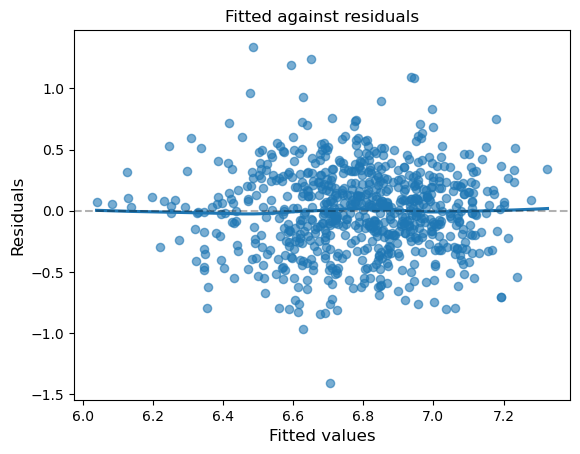

In [129]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.savefig('Model 7 resid')
plt.show()

In [130]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

influence_results_model7 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  8   9  10  13  29  35  55 111 115 130 178 194 230 256 266 286 289 307
 311 338 343 435 454 483 487 490 493 510 537 562 591 598 609 617 639 647
 651 653 656 663 667 675 677 683 721]
Influential points based on DFBETAS:
[  0   2   8   8   8   9   9   9   9   9  10  10  10  13  13  13  14  14
  18  21  22  26  27  29  29  29  29  29  29  35  35  35  35  38  47  47
  54  55  55  55  55  57  57  58  61  63  72  79  79  79  81  82  82  85
  88  94  94  94  94  94  95  96  96  96  99 107 107 111 111 111 114 114
 115 115 115 115 115 115 126 126 126 130 130 130 130 130 133 133 136 136
 136 136 136 138 139 139 141 141 141 146 151 153 153 160 161 163 163 163
 164 164 168 172 178 178 178 178 183 183 183 185 185 187 188 188 190 194
 194 194 194 194 199 199 200 200 200 200 200 207 210 210 210 214 214 214
 217 220 227 227 229 230 230 230 230 230 230 233 233 233 235 247 247 251
 251 252 255 255 255 256 256 266 266 268 271 271 271 274 281 281 285 286
 286

### Model 8 - Log Model with Splines

In [132]:
iq1 = train['IQ'].quantile(0.2)
iq2 = train['IQ'].quantile(0.4)
iq3 = train['IQ'].quantile(0.6)
iq4 = train['IQ'].quantile(0.8)

train['IQ_step1'] = (train['IQ'] > iq1) * (train['IQ'] - iq1)
train['IQ_step2'] = (train['IQ'] > iq2) * (train['IQ'] - iq2)
train['IQ_step3'] = (train['IQ'] > iq3) * (train['IQ'] - iq3)
train['IQ_step4'] = (train['IQ'] > iq4) * (train['IQ'] - iq4)

kww1 = train['KWW'].quantile(0.2)
kww2 = train['KWW'].quantile(0.4)
kww3 = train['KWW'].quantile(0.6)
kww4 = train['KWW'].quantile(0.8)

train['KWW_step1'] = (train['KWW'] > kww1) * (train['KWW'] - kww1)
train['KWW_step2'] = (train['KWW'] > kww2) * (train['KWW'] - kww2)
train['KWW_step3'] = (train['KWW'] > kww3) * (train['KWW'] - kww3)
train['KWW_step4'] = (train['KWW'] > kww4) * (train['KWW'] - kww4)

t1 = train['tenure'].quantile(0.2)
t2 = train['tenure'].quantile(0.4)
t3 = train['tenure'].quantile(0.6)
t4 = train['tenure'].quantile(0.8)

# Create piecewise spline terms
train['tenure_step1'] = (train['tenure'] > t1) * (train['tenure'] - t1)
train['tenure_step2'] = (train['tenure'] > t2) * (train['tenure'] - t2)
train['tenure_step3'] = (train['tenure'] > t3) * (train['tenure'] - t3)
train['tenure_step4'] = (train['tenure'] > t4) * (train['tenure'] - t4)

In [133]:
def forward_selected(data, response, nominated = []):
    """Linear model designed by forward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by forward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    selected = nominated
    remaining.remove(response)
    remaining ^= set(selected)
    current_score, best_new_score = 0.0, 0.0
    if nominated:
        formula = "{} ~ {} + 1".format(response, ' + '.join(nominated))
        current_score= smf.ols(formula, data).fit().rsquared_adj
        best_new_score = current_score
        print("you nominated variable(s) %s, the adj_r2 is: %f" %(nominated, current_score))
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("adding %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            selected.append(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [134]:
df = train[['lwage', 'educ', 'exper', 'KWW_step1', 'KWW_step2', 'KWW_step3', 'KWW_step4', "IQ_step1", 'IQ_step2', 'IQ_step3', 'IQ_step4', 'tenure_step1', 'tenure_step2', 'tenure_step3', 'tenure_step4', 'hours', 'IQ', 'KWW', 'tenure', 'age', 'married', 'black', 'south', 'urban', 'sibs', 'meduc', 'feduc']]

In [135]:
model = forward_selected(df, 'lwage')

adding IQ increases adj_r2 from 0.000000 to 0.102645
adding KWW_step2 increases adj_r2 from 0.102645 to 0.149328
adding urban increases adj_r2 from 0.149328 to 0.177351
adding tenure increases adj_r2 from 0.177351 to 0.201693
adding married increases adj_r2 from 0.201693 to 0.220959
adding educ increases adj_r2 from 0.220959 to 0.239612
adding black increases adj_r2 from 0.239612 to 0.253003
adding exper increases adj_r2 from 0.253003 to 0.265600
adding hours increases adj_r2 from 0.265600 to 0.275576
adding tenure_step1 increases adj_r2 from 0.275576 to 0.282216
adding south increases adj_r2 from 0.282216 to 0.285259
adding KWW increases adj_r2 from 0.285259 to 0.286713
adding KWW_step4 increases adj_r2 from 0.286713 to 0.287169
final model is lwage ~ IQ + KWW_step2 + urban + tenure + married + educ + black + exper + hours + tenure_step1 + south + KWW + KWW_step4 + 1, with adj_r2 of 0.287169


In [136]:
model = smf.ols('lwage ~ IQ + KWW + KWW_step2 + urban + tenure + tenure_step1 + married + educ + black + exper + hours + south + black_tenure', data=train).fit(cov_type='HC0')
model8=model
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.303
Model:                            OLS   Adj. R-squared:                  0.291
Method:                 Least Squares   F-statistic:                     26.40
Date:                Fri, 30 May 2025   Prob (F-statistic):           1.01e-52
Time:                        15:44:31   Log-Likelihood:                -256.93
No. Observations:                 733   AIC:                             541.9
Df Residuals:                     719   BIC:                             606.2
Df Model:                          13                                         
Covariance Type:                  HC0                                         
================================================================================
                   coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept        5.6308      0.208     27.038      0.000       5.223       6.039
IQ               0.0039      0.001      3.554      0.000       0.002       0.006
KWW             -0.0061      0.004     -1.583      0.113      -0.014       0.001
KWW_step2        0.0199      0.006      3.333      0.001       0.008       0.032
urban            0.1736      0.028      6.157      0.000       0.118       0.229
tenure           0.0845      0.036      2.362      0.018       0.014       0.155
tenure_step1    -0.0806      0.037     -2.192      0.028      -0.153      -0.009
married          0.1861      0.041      4.509      0.000       0.105       0.267
educ             0.0440      0.009      5.135      0.000       0.027       0.061
black           -0.2909      0.077     -3.802      0.000      -0.441      -0.141
exper            0.0125      0.004      3.458      0.001       0.005       0.020
hours           -0.0061      0.002     -2.810      0.005      -0.010      -0.002
south           -0.0574      0.030     -1.902      0.057      -0.117       0.002
black_tenure     0.0197      0.008      2.540      0.011       0.004       0.035
==============================================================================
Omnibus:                        6.382   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.041   Jarque-Bera (JB):                8.696
Skew:                           0.006   Prob(JB):                       0.0129
Kurtosis:                       3.533   Cond. No.                     1.85e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.85e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [137]:
model.mse_resid**0.5

0.3468804307866778

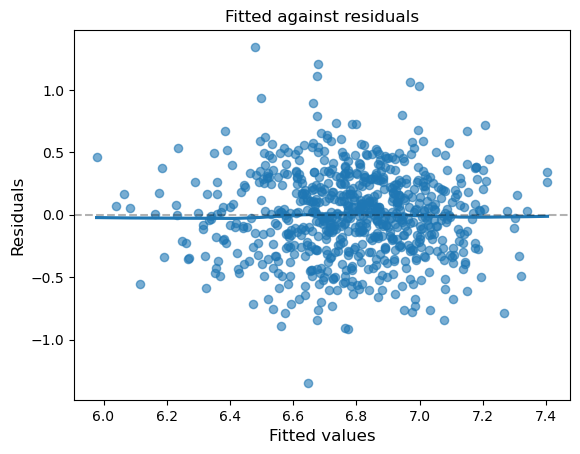

In [138]:
resid = model.resid
fitted = model.fittedvalues
fig, ax= plt.subplots()
sns.regplot(x=fitted, y=resid, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')
plt.savefig('model 8 resid')  
plt.show()

In [139]:
#Model DFBETA, DFBETAS and Cooks

infl_re = model.get_influence()
hatvals_re = infl_re.hat_matrix_diag    # hat values
t_resid_re = infl_re.resid_studentized_external  # externally Studentised residuals
(c_re, _) = infl_re.cooks_distance    # Cooks distance.
dfbs_re = infl_re.dfbetas              # DFBETAS
(dff_re, dffs_re) = infl_re.dffits     # DFFITS, ignore dffs_re as it is already standardised

# Check if they exceed the thresholds: cook_threshold = 4 / n, dfbetas_threshold = 2 / sqrt(n)
n, p= dfbs_re.shape

cook_threshold = 4/n
dfbetas_threshold = 2/np.sqrt(n)
dffits_threshold = 2*np.sqrt(p)/np.sqrt(n)

cooks_values=np.zeros(n)
for i in range(n):
    if c_re[i] >= cook_threshold:
        cooks_values[i] = 1
    else:
        cooks_values[i] = 0 
flagged_indices_cooks = np.where(cooks_values == 1)[0]
if len(flagged_indices_cooks) == 0:
    print("No influential points based on Cook's Distance.")
else:
    print("Influential points based on Cook's Distance:")
    print(flagged_indices_cooks)

dfbetas_values = np.zeros(dfbs_re.shape)
for i in range(n):
    for j in range(p):
        if np.abs(dfbs_re[i,j]) >= dfbetas_threshold:
            dfbetas_values[i,j] = 1
        else:
            dfbetas_values[i,j] = 0
flagged_indices_dfb = np.where(dfbetas_values == 1)[0]
if len(flagged_indices_dfb) == 0:
    print("No influential points based on DFBETAS.")
else:
    print("Influential points based on DFBETAS:")
    print(flagged_indices_dfb)

dffit_values = np.zeros(n)
for i in range(n):
   if np.abs(dff_re[i]) >= dffits_threshold:
       dffit_values[i] = 1
   else:
        dffit_values[i] = 0
flagged_indices_dff = np.where(dffit_values == 1)[0]
if len(flagged_indices_dff) == 0:
    print("No influential points based on DFFITS.")
else:
    print("Influential points based on DFFITS:")
    print(flagged_indices_dff)

#Results
influence_results_model8 = {
    'cooks': flagged_indices_cooks,
    'dffits': flagged_indices_dff,
    'dfbetas': flagged_indices_dfb,
    'dfbetas_matrix': dfbetas_values,  # optional for predictor-specific info
    'hatvals': hatvals_re
}

Influential points based on Cook's Distance:
[  8   9  10  14  29  35  55 111 114 115 130 200 230 271 285 286 289 301
 311 338 343 396 410 435 481 483 487 490 493 537 562 598 617 639 642 647
 651 653 656 663 667 677 683 721 732]
Influential points based on DFBETAS:
[  0   8   8   8   8   8   8   8   9   9   9   9   9   9   9   9  10  10
  13  13  13  14  14  14  14  14  18  22  27  27  27  27  27  27  28  29
  29  29  29  29  29  29  29  29  29  35  35  35  35  35  35  38  38  47
  47  54  55  55  55  55  57  57  58  58  61  61  72  79  79  79  79  81
  82  82  84  85  94  95  96  99 107 107 107 107 107 107 111 111 112 113
 114 114 114 114 115 115 115 115 115 117 124 127 130 130 130 130 130 130
 130 133 133 133 133 134 134 134 136 136 136 138 138 139 139 141 141 141
 145 146 146 153 153 153 160 160 160 160 160 160 160 161 163 163 164 164
 165 168 168 168 172 172 172 178 178 182 183 183 185 185 185 186 186 186
 187 187 188 188 190 190 190 192 192 194 194 194 199 199 200 200 200 200
 200

### Table of flagged points


In [351]:
all_influences = {
    'M0': influence_results_model0,
    'M1': influence_results_model1,
    'M2': influence_results_model2,
    'M3': influence_results_model3,
    'M4': influence_results_model4,
    'M5': influence_results_model5,
    'M6': influence_results_model6,
    'M7': influence_results_model7,
    'M8': influence_results_model8
}
summary_dict={}
train = train.reset_index(drop=True)

for model_name, results in all_influences.items(): 
    #Cook
    for obs in results['cooks']:
        if obs not in summary_dict: summary_dict[obs]={'models_flag': set([]), 'method': set([])}
        summary_dict[obs]['models_flag'].add(model_name)
        summary_dict[obs]['method'].add("Cook's")
    #dffits
    for obs in results['dffits']:
        if obs not in summary_dict: summary_dict[obs]={'models_flag': set([]), 'method': set([])}
        summary_dict[obs]['models_flag'].add(model_name)
        summary_dict[obs]['method'].add("DFFITS")
    #dfbetas
    for obs in results['dfbetas']:
        if obs not in summary_dict: summary_dict[obs]={'models_flag': set([]), 'method': set([]) }
        summary_dict[obs]['models_flag'].add(model_name)
        summary_dict[obs]['method'].add("DFBETAS")

        if 'dfbetas_predictors' in results:
            predictors = results['dfbetas_predictors'].get(obs, [])
            summary_dict[obs]['predictors_flag'].update(predictors)

summary_rows = []
for obs,info in summary_dict.items():
    summary_rows.append({ 'obs_index': obs, 'models_flag': ','.join(sorted(info['models_flag'])), 'num_models_flag':len(info['models_flag']), 
                         'method':','.join(sorted(info['method'])), 'num_methods_flag': len(info['method'])})
#final
summary_df = pd.DataFrame(summary_rows).sort_values(by=['num_models_flag','num_methods_flag'], ascending=False)
summary_df_with_data = summary_df.merge(train, left_on='obs_index', right_index=True)

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', None)

train['wage_quantile'] = pd.qcut(train['wage'], q=4, labels=['Q1', 'Q2', 'Q3', 'Q4'])
summary_df_final = summary_df_with_data.merge(train[['wage_quantile']], left_on='obs_index', right_index=True)
display(summary_df_final)
summary_df_final.to_csv('influence_summary.csv', index=False)
cols_to_exclude = train.loc[:, 'hours':'tenure_step4'].columns
filtered_df = summary_df_final.drop(columns=cols_to_exclude)
top_50_filtered = filtered_df.head(50)
top_50_filtered.to_csv('top_50_influence_summary.csv', index=False)

,obs_index,models_flag,num_models_flag,method,num_methods_flag,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage,meduc_bin,feduc_bin,KWW_step,IQ_step,tenure_step,IQ_step1,IQ_step2,IQ_step3,IQ_step4,KWW_step1,KWW_step2,KWW_step3,KWW_step4,tenure_step1,tenure_step2,tenure_step3,tenure_step4,wage_quantile_x,wage_quantile_y
0,8,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2004,48,105,48,18,10,0,34,1,0,0,1,2,1.0,12.0,12.0,7.602900,Mid,Mid,14,0,0,14.6,7.0,-0.0,-0.0,19.0,14.0,10.0,6.0,-0.0,-0.0,-0.0,-0.0,Q4,Q4
1,9,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,3078,30,107,23,13,11,4,29,1,0,0,1,2,2.0,12.0,12.0,8.032035,Mid,Mid,0,2,0,16.6,9.0,1.0,-0.0,-0.0,-0.0,-0.0,-0.0,2.0,-0.0,-0.0,-0.0,Q4,Q4
2,13,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2308,40,116,42,17,8,2,38,1,0,0,0,6,1.0,12.0,13.0,7.744137,Mid,High,8,11,0,25.6,18.0,10.0,2.0,13.0,8.0,4.0,0.0,0.0,-0.0,-0.0,-0.0,Q4,Q4
3,57,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,1924,50,98,49,17,6,7,38,1,0,0,1,1,1.0,4.0,NaN,7.562161,Low,NaN,15,0,2,7.6,0.0,-0.0,-0.0,20.0,15.0,11.0,7.0,5.0,2.0,-0.0,-0.0,Q4,Q4
4,96,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2137,45,145,50,16,17,8,38,1,0,0,1,2,1.0,12.0,12.0,7.667158,Mid,Mid,16,40,3,54.6,47.0,39.0,31.0,21.0,16.0,12.0,8.0,6.0,3.0,-0.0,-0.0,Q4,Q4
7,161,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,1899,40,127,49,18,9,14,36,0,0,0,1,0,1.0,10.0,NaN,7.549083,Mid,NaN,15,22,9,36.6,29.0,21.0,13.0,20.0,15.0,11.0,7.0,12.0,9.0,5.0,2.0,Q4,Q4
8,178,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2771,50,134,45,18,6,7,34,1,0,0,1,4,3.0,16.0,16.0,7.926963,High,High,11,29,2,43.6,36.0,28.0,20.0,16.0,11.0,7.0,3.0,5.0,2.0,-0.0,-0.0,Q4,Q4
9,183,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2137,40,120,48,16,16,3,37,1,0,1,1,3,3.0,12.0,12.0,7.667158,Mid,Mid,14,15,0,29.6,22.0,14.0,6.0,19.0,14.0,10.0,6.0,1.0,-0.0,-0.0,-0.0,Q4,Q4
10,185,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,2500,40,95,51,15,12,9,36,1,0,0,1,3,1.0,16.0,16.0,7.824046,High,High,17,0,4,4.6,-0.0,-0.0,-0.0,22.0,17.0,13.0,9.0,7.0,4.0,0.0,-0.0,Q4,Q4
11,188,"M0,M1,M2,M3,M4,M5,M6,M7,M8",9,"Cook's,DFBETAS,DFFITS",3,520,50,107,30,18,6,3,29,1,0,0,0,10,1.0,12.0,14.0,6.253829,Mid,High,0,2,0,16.6,9.0,1.0,-0.0,1.0,-0.0,-0.0,-0.0,1.0,-0.0,-0.0,-0.0,Q1,Q1


## Part 6

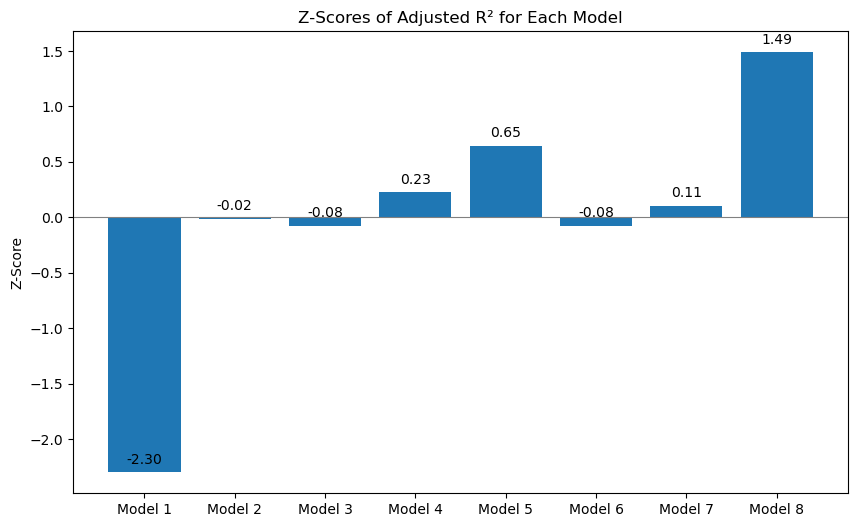

In [142]:
#Models z-scores

#ajd-R2 values
adj_r2 = np.array([0.228, 0.266, 0.265, 0.270, 0.277, 0.265, 0.268, 0.291])
models = [f'Model {i+1}' for i in range(len(adj_r2))]

#Mean and std-d
mean_r2 = np.mean(adj_r2)
std_r2 = np.std(adj_r2)

# z-scores
z_scores = (adj_r2 - mean_r2) / std_r2

plt.figure(figsize=(10, 6))
bars = plt.bar(models, z_scores)
plt.axhline(0, color='gray', linewidth=0.8)
plt.ylabel("Z-Score")
plt.title("Z-Scores of Adjusted R² for Each Model")
for bar, z in zip(bars, z_scores):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2.0, yval + 0.05, f"{z:.2f}", ha='center', va='bottom')
plt.show()


### Model 2: Log-Linear Model with Additional Predictors 

In [144]:
model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours', data=train).fit(cov_type = 'HC0')
lwage_preds = model.predict(test)

#actual wages (exp)
actual_wages_log = test['lwage']

#residuals 
resid_log = actual_wages_log - lwage_preds
SER = np.std(resid_log)
correction_factor = np.exp((SER**2)/2)

#transform actual and prediction back to wage scale from log
actual_wages = np.exp(actual_wages_log)*correction_factor
predicted_wages = np.exp(lwage_preds)*correction_factor
resid = actual_wages - predicted_wages
print(model.llf, model.aic, model.bic)     # Log-likelihood, AIC and BIC

-272.1028945742437 562.2057891484874 603.5801004654672


In [145]:
#RSME, MAD and Forecasted R2
RSME= np.sqrt(np.mean((predicted_wages - actual_wages)**2))
MAD = np.mean(np.abs(predicted_wages - actual_wages))

SS_res = sum((actual_wages - predicted_wages)**2)
SS_tot = sum((actual_wages - np.mean(actual_wages))**2)
Forecasted_R2 = 1-(SS_res/SS_tot)

n = test.shape[0]
k = model.params.shape[0]-1
forecasted_adj_r2 = 1- ((1-Forecasted_R2)*(n-1)/(n-k-1))

print(RSME)
print(MAD)
print(Forecasted_R2)
print(forecasted_adj_r2)

404.92227144043204
292.75896991871315
0.2220397568084066
0.186271469765115


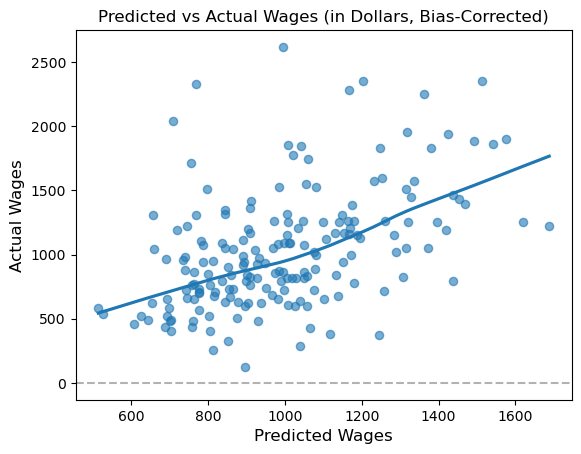

<function matplotlib.pyplot.show(close=None, block=None)>

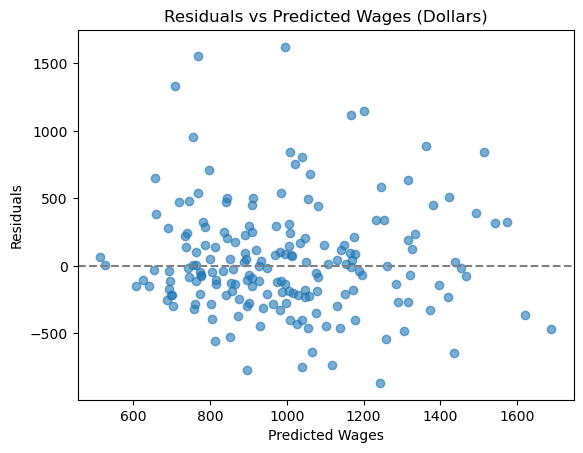

In [146]:
#Predicted vs Actual Wages (Scatterplot) Model 2
predicted = predicted_wages
actual = actual_wages
fig, ax= plt.subplots()
sns.regplot(x=predicted, y=actual, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Predicted Wages',  {'fontsize': 12})
ax.set_ylabel('Actual Wages', {'fontsize': 12})
ax.set_title('Predicted vs Actual Wages (in Dollars, Bias-Corrected)')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.show()

#Residuals vs Predicted Wages Model 2
fig, ax = plt.subplots()
ax.scatter(predicted_wages, resid, alpha=0.6)
ax.axhline(0, color='grey', linestyle='--')

ax.set_xlabel('Predicted Wages')
ax.set_ylabel('Residuals')
ax.set_title('Residuals vs Predicted Wages (Dollars)')
plt.show

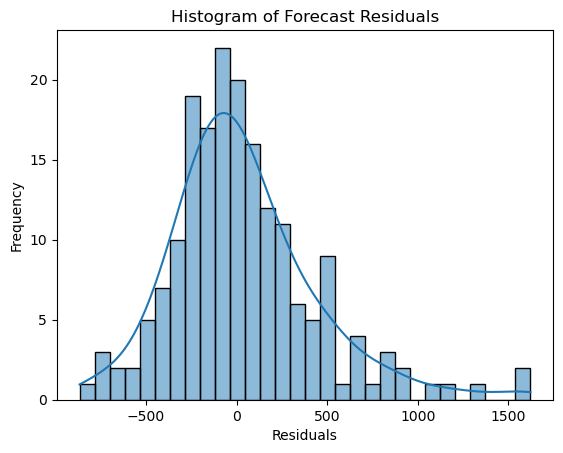

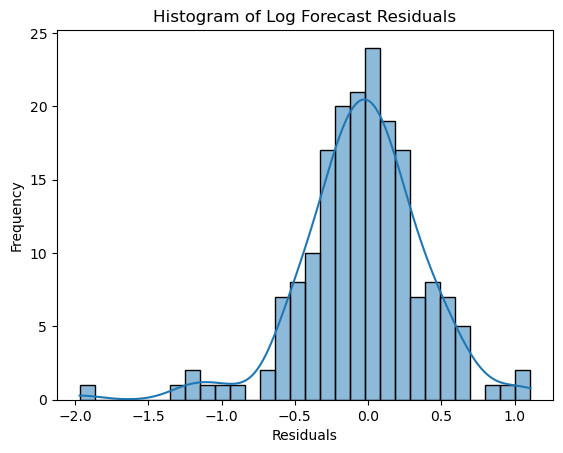

In [147]:
#Histogram of Residuals Model 2
sns.histplot(resid, bins=30, kde=True)
plt.title('Histogram of Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
#Histogram of Log Forecast Residuals Model 2
sns.histplot((test['lwage']-lwage_preds), bins=30, kde=True)
plt.title('Histogram of Log Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

### Model 4: Log-Linear Model with Interaction Term (black x tenure) 

In [149]:
test['black_tenure'] = test['black'] * test['tenure']

model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + black_tenure', data=train).fit(cov_type = 'HC0')
lwage_preds = model.predict(test)

#actual wages (exp)
actual_wages_log = test['lwage']

#residuals 
resid_log = actual_wages_log - lwage_preds
SER = np.std(resid_log)
correction_factor = np.exp((SER**2)/2)

#transform actual and prediction back to wage scale from log
actual_wages = np.exp(actual_wages_log)*correction_factor
predicted_wages = np.exp(lwage_preds)*correction_factor
resid = actual_wages - predicted_wages
print(model.llf, model.aic, model.bic)     # Log-likelihood, AIC and BIC

-269.7358871062578 559.4717742125156 605.4432312313821


In [150]:
#RSME, MAD and Forecasted R2
RSME= np.sqrt(np.mean((predicted_wages - actual_wages)**2))
MAD = np.mean(np.abs(predicted_wages - actual_wages))

SS_res = sum((actual_wages - predicted_wages)**2)
SS_tot = sum((actual_wages - np.mean(actual_wages))**2)
Forecasted_R2 = 1-(SS_res/SS_tot)

n = test.shape[0]
k = model.params.shape[0]-1
forecasted_adj_r2 = 1- ((1-Forecasted_R2)*(n-1)/(n-k-1))

print(RSME)
print(MAD)
print(Forecasted_R2)
print(forecasted_adj_r2)

404.55015182372665
292.5108338187586
0.22336393573921576
0.18296090349443506


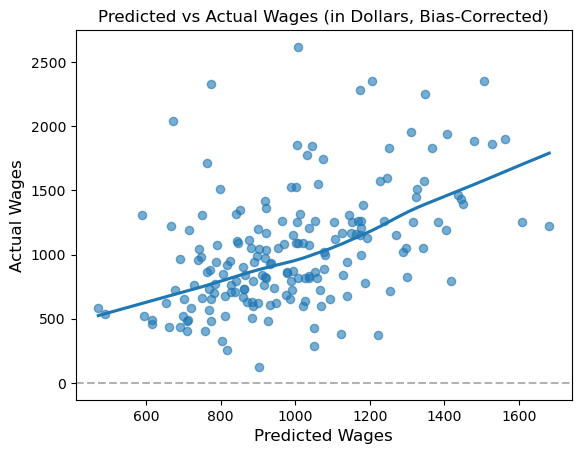

<function matplotlib.pyplot.show(close=None, block=None)>

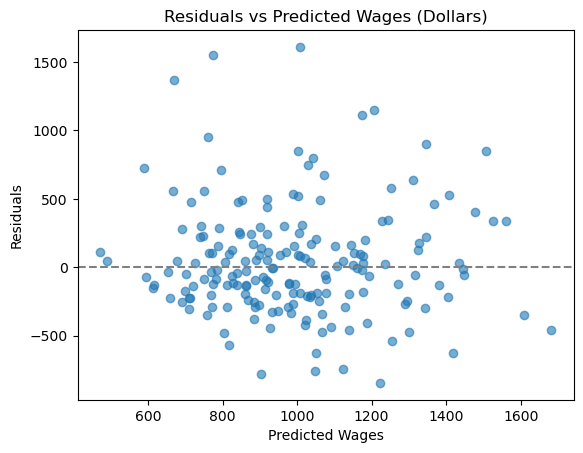

In [151]:
#Predicted vs Actual Wages (Scatterplot) Model 4
predicted = predicted_wages
actual = actual_wages
fig, ax= plt.subplots()
sns.regplot(x=predicted, y=actual, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Predicted Wages',  {'fontsize': 12})
ax.set_ylabel('Actual Wages', {'fontsize': 12})
ax.set_title('Predicted vs Actual Wages (in Dollars, Bias-Corrected)')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.show()

#Residuals vs Predicted Wages Model 4
fig, ax = plt.subplots()
ax.scatter(predicted_wages, resid, alpha=0.6)
ax.axhline(0, color='grey', linestyle='--')

ax.set_xlabel('Predicted Wages')
ax.set_ylabel('Residuals')
ax.set_title('Residuals vs Predicted Wages (Dollars)')
plt.show

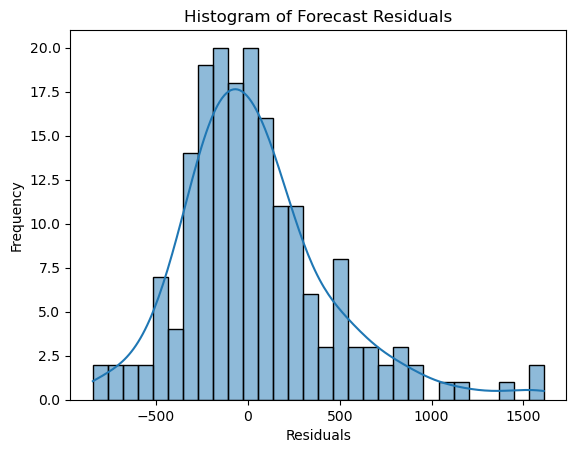

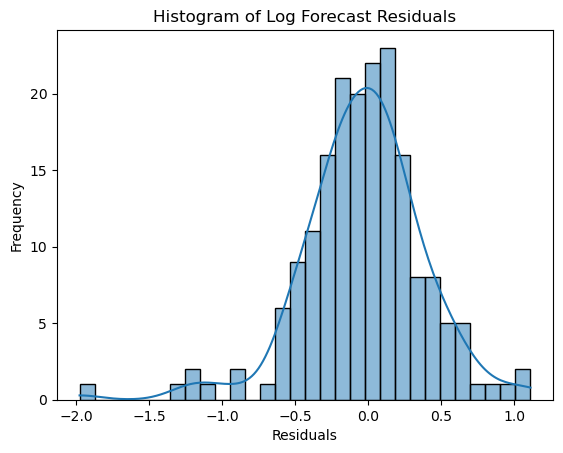

In [152]:
#Histogram of Residuals Model 4
sns.histplot(resid, bins=30, kde=True)
plt.title('Histogram of Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
#Histogram of Log Forecast Residuals Model 4
sns.histplot((test['lwage']-lwage_preds), bins=30, kde=True)
plt.title('Histogram of Log Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

### Model 5 Log-Linear Model with Linear Spline (KWW) 

In [154]:
xi = 34

# Create the spline variable (positive part only)
test['KWW_step'] = (test['KWW'] > xi) * (test['KWW'] - xi)

model = smf.ols('lwage ~ IQ + tenure + urban + educ + married + exper + black + hours + KWW + KWW_step', data=train).fit(cov_type = 'HC0')
lwage_preds = model.predict(test)

#actual wages (exp)
actual_wages_log = test['lwage']

#residuals 
resid_log = actual_wages_log - lwage_preds
SER = np.std(resid_log)
correction_factor = np.exp((SER**2)/2)

#transform actual and prediction back to wage scale from log
actual_wages = np.exp(actual_wages_log)*correction_factor
predicted_wages = np.exp(lwage_preds)*correction_factor
resid = actual_wages - predicted_wages
print(model.llf, model.aic, model.bic)     # Log-likelihood, AIC and BIC

-265.36835817118435 552.7367163423687 603.3053190631218


In [155]:
#RSME, MAD and Forecasted R2 and Forecasted Adj-R2
RSME= np.sqrt(np.mean((predicted_wages - actual_wages)**2))
MAD = np.mean(np.abs(predicted_wages - actual_wages))

SS_res = sum((actual_wages - predicted_wages)**2)
SS_tot = sum((actual_wages - np.mean(actual_wages))**2)
Forecasted_R2 = 1-(SS_res/SS_tot)

n = test.shape[0]
k = model.params.shape[0]-1
forecasted_adj_r2 = 1- ((1-Forecasted_R2)*(n-1)/(n-k-1))

print(RSME)
print(MAD)
print(Forecasted_R2)
print(forecasted_adj_r2)

397.08157106661264
284.1906079872482
0.2497933902042403
0.20617672684402166


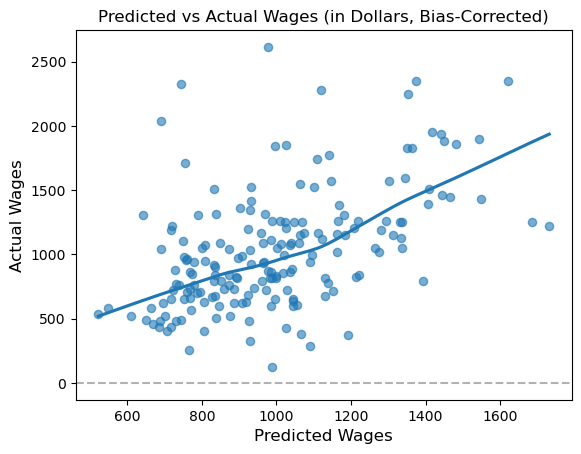

<function matplotlib.pyplot.show(close=None, block=None)>

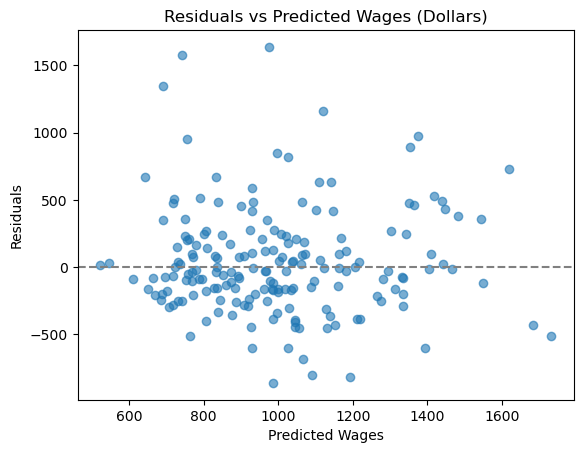

In [156]:
#Predicted vs Actual Wages (Scatterplot) Model 5
predicted = predicted_wages
actual = actual_wages
fig, ax= plt.subplots()
sns.regplot(x=predicted, y=actual, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Predicted Wages',  {'fontsize': 12})
ax.set_ylabel('Actual Wages', {'fontsize': 12})
ax.set_title('Predicted vs Actual Wages (in Dollars, Bias-Corrected)')
plt.axhline(color='Black', alpha=0.3, linestyle='--')  
plt.show()

#Residuals vs Predicted Wages Model 5
fig, ax = plt.subplots()
ax.scatter(predicted_wages, resid, alpha=0.6)
ax.axhline(0, color='grey', linestyle='--')

ax.set_xlabel('Predicted Wages')
ax.set_ylabel('Residuals')
ax.set_title('Residuals vs Predicted Wages (Dollars)')
plt.show

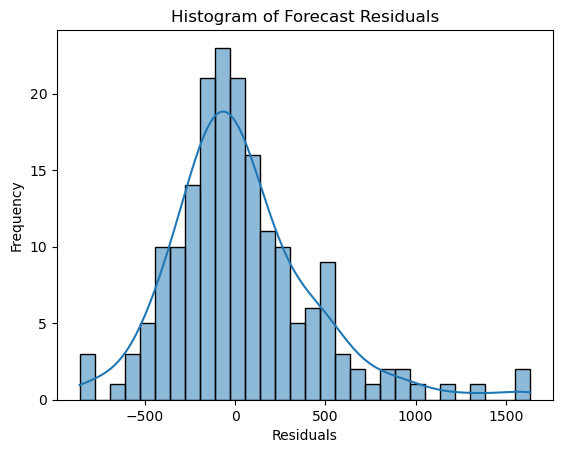

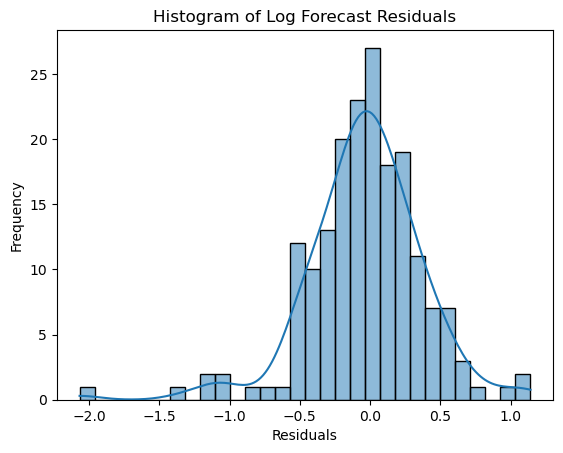

In [157]:
#Histogram of Residuals Model 5
sns.histplot(resid, bins=30, kde=True)
plt.title('Histogram of Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()
#Histogram of Log Forecast Residuals Model 5
sns.histplot((test['lwage']-lwage_preds), bins=30, kde=True)
plt.title('Histogram of Log Forecast Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

In [ ]:
###